$$ 
\begin{aligned}
\LARGE
\bold{
ARTISTS \space \space COLLABORATION \space\space NETWORK}
\end{aligned}
$$

$$ 
\begin{aligned}
\Large
{Explainer \space \space Notebook}
\end{aligned}
$$

# ARTISTS COLLABORATION NETWORK
## 


This explainer notebook is made as a part of the final exam project for the course 02805, Social graphs and interactions, at DTU during the fall of 2020.
The results of the explainer notebook are also displayed on the [webpage](https://artists-collaborations-network.netlify.app/).
Several other notebooks and files were used to construct the explainer notebook. 
These can be found on [GitHub](https://github.com/andreas-kaae/socialgraphs2020_artists_collaborations_network),
 while the bulk of data is available on [sharpoint](https://dtudk.sharepoint.com/:f:/s/SocialGraphs/EuBRcNF_in5DstLNO9TLj-cB15cRZaLtjwzbqWebhIfczw?e=M93Op4)
 due to data limitations on github. To access the data a DTU login is needed


The authors are:  
*Andreas Kaae - s154395*  
*Silvia De Sojo - s192374*  
*Pietro Rampazzo - s203257*
<br><br>


**Collaboration table**  
All team members have contributed equally to the project and know and understand every aspect of the project.
However, accordingly to the description of the project a person needs to be responsible for every aspect of the project.
The table below is thus constructed.  



| Task                                    	| Main responsible 	|
|-----------------------------------------	|:----------------:	|
| Retrieval of data                       	|      Pietro      	|
| Scrapping Wikipedia API                  	|      Silvia      	|
| Scrapping Spotify API                    	|      Pietro      	|
| Scrapping Genius API                    	|      Andreas      |
| Building the network                    	|      Andreas     	|
| Network of genres                       	|      Silvia      	|
| Network analysis                        	|      Silvia      	|
| How do artist collaborate? - Popularity 	|      Silvia      	|
| How do artist collaborate? - Genre      	|      Silvia      	|
| How do artist collaborate? - Sentiment  	|      Andreas 	    |
| How do artist collaborate? - Time       	|      Andreas     	|
| Text analysis                           	|      Andreas     	|
| Webpage content                	        |      Andreas      |
| Setup and desing of webpage             	|      Pietro      	|
| Dynamic graphics             	            |      Pietro      	|


# Motivation
Listening to one of your favorite artists can be amazing on its own. 
But realizing that two of your favorite artists started collaborating can be just breathtaking.
This made our group wonder about the network of collaborations between artists and genres. 
Because how do artists collaborate? 
Is it only popular artists that collaborate?
Are artist from certain genres more likely to collaborate?
Do artists mainly collaborate within their own genre or also outside?
Do artists with happier or sadder song lyrics tend to collaborate more?
And how about the time, has the level of collaboration change?

To answer these quesions a network of music artists is constructed such that every node in the network resembles an artist while edges in the network resembles collaborations. 
If two artists have collaborated on a song they are thereby connected by an edge.
The network thus becomes a big network of collaborations of music artists.

# Table of Contents

**0. Imports  
1. Data Set**  
1.1. Artists list  
1.2. Artists details  
1.3. Lyrics  

**2. Building the network**  
2.1. Obtaining the artists genres  

**3. Network Analysis**  

**4. How do artists collaborate?**  
4.1. Collaborations vs. Popularity  
4.2. Collaborations vs. Genre  
4.3. Collaborations vs. Sentiment  
4.4. Collaborations vs. Time  
4.5. Collaborations analysis conclusion  

**5. Text analysis**  
5.1. Lyrics word clouds  
5.2. Lyrics sentiment

**6. Conclusion**



# 0. Imports

In [2]:
# Imports
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import pandas as pd
import numpy as np
import collections
import statistics
import random
import itertools
import json
import os
import powerlaw
import community
import math
import nltk
from nltk import FreqDist
from nltk.corpus import stopwords
from nltk import word_tokenize
import wordcloud
from wordcloud import get_single_color_func
sns.set() # set the theme of the plots
sns.set_theme(context="notebook", style="ticks", font_scale=1.2)

A set of basic functions, have been saved in `useful_functions.ipynb` notebook to reduce and simplify the output of the explainer:

In [24]:
# load functions
%run src/analysis/useful_functions.ipynb

# 1. Data set

The data for the project is collected through the [Spotify Web API](https://developer.spotify.com/documentation/web-api/quick-start/) and the lyric published on [Genius.com](https://genius.com/). 
However, since Spotify has more than 50 million tracks available, which cover most music genres, it was necessary to perform the extraction from a sub-set of musicians. To define this list of artists we used Wikipedia's page *[List of musicians](https://en.wikipedia.org/wiki/Lists_of_musicians)*. The necessary steps done when scrapping, are presented below:

## 1.1 Artists list

To construct the sub-set of musicians we wanted to use a source which could provide a set of artists from different genres.
Wikipedias [List of musicians]( https://en.wikipedia.org/wiki/Lists_of_musicians) provided a set of artists classified by genres. 
There is a total of 53 genres on the page and each genre link to a new genre page where all artists are listed.
The high amount of different genres were important to ensure a diverse set of artists.

The objective is therefore to use to the Wikipedia API, and obtain a list of artists with the necessary format 
to later obtain the information from the Spotify API:

```
artists = [[ {"name": "Justin Bieber", "id": ""},
    {"name": "Kanye West", "id": ""},
    {"name": "Ariana Grande", "id": ""}
]]
```
To achieve it the steps followed where:

1. Scrape the *List of Musicians* page and obtain a set of different genres  
1. Define scenarios based on the different format patterns of the genre pages
1. Scrape the genre pages based on scenarios to obtain the list of artists

The different steps taken are detailed in the notebook `scraper-wikipedia.ipynb`.

## 1.2 Artists details
At this point, the [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/) library has been used.
This is a Python library which exposes several methods to query the Spotify Web API.
This process has been run in the `scraper-spotify.ipynb` notebook.

It is necessary to initialize a Spotipy client to query the API and it is mandatory to pass some credentials.

```python
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
    client_id=os.environ["SP_CLIENT"],
    client_secret=os.environ["SP_SECRET"]
    )
)
```

First of all, for each artist contained in the generated list, it is necessary to identify the corresponding Spotify ID.
An example is shown below.

```python
sp.search(q="The Beatles", type="artist")
```

Some results might contain multiple artists with the same name.
In this case, only the one with the higher `popularity` value will be taken into account.

All the artists and their details are collected in a list of dictionaries.
The structure model below has been followed:

```json
[
  {
    "name": "The Beatles",
    "id": "3WrFJ7ztbogyGnTHbHJFl2", # Spotify ID
    "popularity": 89,
    "genres": [
      "beatlesque",
      "british invasion",
      "classic rock",
      "merseybeat",
      "psychedelic rock",
      "rock"
    ]
  },
  ...
]

```

The `popularity` value is calculated by Spotify - according to the documentation:

> The popularity of the artist. The value will be between 0 and 100, with 100 being the most popular. The artist’s popularity is calculated from the popularity of all the artist’s tracks.

[[ ref ]](https://developer.spotify.com/documentation/web-api/reference/artists/get-artist/)

Also, the `genres` list is provided by Spotify and is associated with an artist.

To narrow down the list of artists filtering has been applied based on the distribution of the popularities (see bar chart below).
The selection has been made based on the mean of all the popularities - 
all the artists with a higher popularity than 43 and with at least one genre will be included in the network.

<img src="/images/popularity-distribution.png" width="50%" />

Plot code: `viz-popularity.ipynb`

A new key is included in the artist dictionary: `isNode`. 
The associated values is a Boolean and it will be `True` if the artist will be a node of the network, otherwise `False`.  

To identify the collaborations it is necessary to query all the discography of each artist.
The discography can be composed by *single albums* and *albums*.
In the last case, the collaborations are specified in the songs which compose an album.

```python
# Query albums or single albums
sp.artist_albums(artist_id="3WrFJ7ztbogyGnTHbHJFl2", type="")

# Query songs contained in an album
sp.album_tracks(album_id="3WrFJ7ztbogyGnTHbHJFl2")
```

The Spotipy library included an already pre-made script to query all the discography ([source](https://github.com/plamere/spotipy/blob/2.16.1/examples/artist_discography.py)).
This facilitates the downloading of the data and handles the [*API Pagination*](https://developer.atlassian.com/server/confluence/pagination-in-the-rest-api/).

For all the nodes, a for loop checked all the identified collaborations reported in the discography.
The ones who were also nodes of the network are appended to a list which will be stored under the `edges` key in the dictionary of the artist.

The final structure of nodes dictionary will follow the example below:

```json
[
  {
    "name": "The Beatles",
    "id": "3WrFJ7ztbogyGnTHbHJFl2",
    "popularity": 89,
    "genres": [
      "beatlesque",
      "british invasion",
      "classic rock",
      "merseybeat",
      "psychedelic rock",
      "rock"
    ],
    "isNode": true,
    "edges": [
      "3WrFJ7ztbogyGnTHbHJFl2",
      "3WrFJ7ztbogyGnTHbHJFl2",
      "3WrFJ7ztbogyGnTHbHJFl2"
    ]
  },
  ...
]
```

## 1.3 Lyrics

To do text analysis the lyrics of the *Top 5* played songs in the United States on Spotify are used.
The songs are easily queried just by specifying the artist ID and the country.

```python 
sp.artist_top_tracks("3WrFJ7ztbogyGnTHbHJFl2", country="US")
```

It is important to store the main artist name and the name of the song. 
With at this information it is possible to
scrape the lyric published on [Genius.com](https://genius.com).

The code can be found in the `scraper-genius.ipynb` notebook.



# 2. Building the network

Once all data was gathered, the next step was to build the network. To do so, it was necessary to perform the following steps:

1. **Construction of network from Spotify data (initialization graph)**
    - With the data retrieved from the Spotify API, the initial network is constructed.
2. **Add genre as an attribute to the network.**
    - This procedure is elaborated in the following section.
3. **Remove nodes with degree `degree = 0`.**
    - As we want the analyze the network of collaboration between artist there is no meaningful way to include nodes which have a degree equal to 0, and thereby no collaborators.
4. **Remove nodes which has too few *top 5 song* lyrics downloaded.**
    - As a part of scraping the top 5 song lyrics (accordingly to the Spotify ratings in the USA) were acquired from [genius](https://genius.com/).
    However, for some nodes, all 5 song lyrics were not successfully acquired due to the song being less famous or purely instrumental.
    Therefor only artist which had 3 or more song lyrics downloaded are kept in the network.
5. **Remove nodes which have songs that are not in English.**
    - Some artists mainly had song lyrics which were in a different language than English, these artists are also removed. 
    This, however, left very few artists in the genres *Latin* and *K-Pop*, as to why the artists within these were also removed.


The result is the final network which is used for analysis throughout the project. 
In step 1 the initial network had 5653 nodes and 24084 edges while after step 5 the network is reduced to 3098 artist and 17155 edges.
The final network is saved as `G_final.graphml`.
All the work performed for step 1, 3, 4 and 5 is detailed in the notebook `network_artists.ipynb`.
While in the section below *Step 2 -  Add genre as an attribute to the network* is deep-dived into.

## 2.1. Obtaining the artists genres

From Spotify information about the genre of the artist is available.
However, it identifies a set of different genres for each artist. This list can contain a wide range of genres, 
from more general, such as *rock* , to more specific, such as *russian alternative rock*. 

To deal with this problem a network of genres is build, and later it is divided into partitions. 
By evaluating the word clouds of each partition it is possible to detect the overall genre for the partition and thereby also which genre/partition an artist belongs to. The steps of this implementation are detailed below.

### Evaluating the set of genres 

After performing the scraping in `scraper-spotify.ipynb`, we obtained the list of genres associated to each artists, 
 all relevant data was saved in `network.json`. 
 We can further match this information with the nodes included in the initialization graph created in `network-artists.ipynb`.



In [4]:
# Importing the initialization graph
G = nx.read_graphml("data/graphs/G_uNW.graphml")

In [ ]:
# Using get_artist_genres function from %useful_functions
dic_ArtGen = get_artist_genres(G,"network.json")

# Taking the Beatles as an example:
print(G._node["3WrFJ7ztbogyGnTHbHJFl2"])
print(dic_ArtGen["3WrFJ7ztbogyGnTHbHJFl2"])

{'name': 'The Beatles', 'popularity': 89}
['beatlesque', 'british invasion', 'classic rock', 'merseybeat', 'psychedelic rock', 'rock']


The dictionary `dic_ArtGen`, is created with function get_artist_genres from `useful_functions.ipynb`, 
which iterates through each artist from `network.json` and links each artist id with its corresponding Spotify genres list.
As an example, we can look how with *The Beatles* id it is possible to get all the genres associated with the band.

Once this link is created it is possible to evaluate how many genres are associated to each artists:

In [ ]:
N_GENRES = [len(gen) for gen in dic_ArtGen.values()]

GENRES_grouped = list(dic_ArtGen.values()) # list genres with sublists by artist
GENRES_flat = [item for genlist in GENRES_grouped for item in genlist] # all genres in the same frequency
GENRES_set = list(set(GENRES_flat)) # set of genres

NG_labels = sorted(set(N_GENRES))
NG_counts = []
for l in NG_labels:
    c = N_GENRES.count(l)
    NG_counts.append(c)

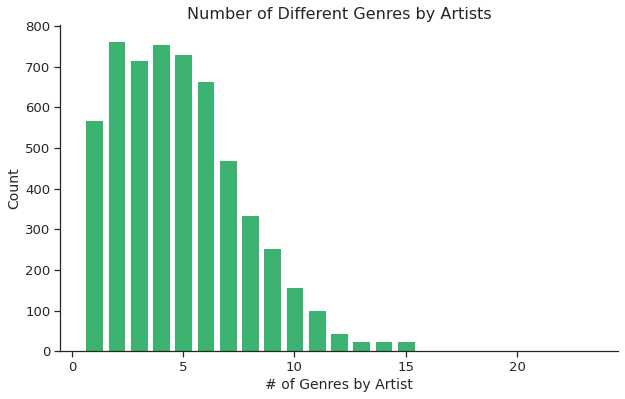

In [ ]:
plt.figure(figsize=(10,6))
plt.bar(NG_labels, NG_counts, width=0.8, color="mediumseagreen") # need to clean the ticks 
plt.ylabel('Count', size=14)
plt.title('Number of Different Genres by Artists', size=16)
plt.xlabel('# of Genres by Artist', size=14)
sns.despine()
plt.show()

In [ ]:
print("75th percentile: ", np.quantile(N_GENRES,.75))

75th percentile:  7.0


The plot follows a skewed distribution, where 75% of the artists have 7 or less associated genres.
The next step will be to evaluate the frequency of the genres:

In [ ]:
# Counting the instances to identify Genres frequency
dic_GenCount = {}
for gen in GENRES_set:
    dic_GenCount[gen] = GENRES_flat.count(gen)

GENRES_sorted = sorted(dic_GenCount.items(), key=lambda x: x[1], reverse=True)

counts_g = [item[1] for item in GENRES_sorted]
labels_g = [item[0] for item in GENRES_sorted]

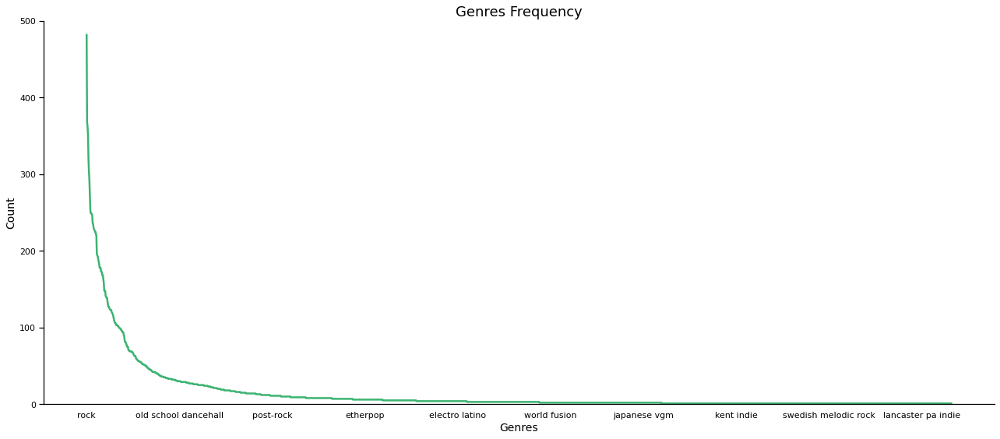

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18, 8))
with sns.axes_style("white"): 
    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})   
    ax.plot(labels_g, counts_g, color="mediumseagreen") 
    every_nth = 200
    for n, label in enumerate(ax.xaxis.get_ticklabels()):
        if n % every_nth != 0:
            label.set_visible(False)
    ax.xaxis.set_ticks_position('none')
    ax.set_ylim([0,500])
    ax.set_ylabel('Count', size=14)
    ax.set_xlabel('Genres', size=14)
    ax.set_title('Genres Frequency', size=18)
fig.tight_layout()
sns.despine()
plt.show()

With the Genres Frequency plot, we aim to visualize how many times a genre appears in the network. 
Hence, we are iterating through all artists list of genres and counting the instances one genre is associated with an artist.

The distribution obtained is highly skewed since not all genres appear with the same frequency. 
For instance, *rock* is the most common genre in our data set, matched with almost 500 artists. 
Moreover, we can see that there is a high number of genres which appear only sporadically, such as *swedish melodic rock* or *japanese vgm*. 
These genres are very specific and therefore we suspect that the artists with these genres might as well have more generic genres associated with them. 
This indicates that a subset of genres could represent the majority of the data. 

In [ ]:
gen_cumsum = np.cumsum(np.array(counts_g)) / sum(np.array(counts_g))
i_80 = [round(e*100,2) for e in gen_cumsum].index(80.01)
i_90 = [round(e*100,2) for e in gen_cumsum].index(90.01)

print("Pareto Cumulative Impact:")
print(f"-> 80% cumulative genre frequency obtained with: {i_80} genres")
print(f"-> 90% cumulative genre frequency obtained with: {i_90} genres")

Pareto Cumulative Impact:
-> 80% cumulative genre frequency obtained with: 310 genres
-> 90% cumulative genre frequency obtained with: 580 genres


If we take a look at the cumulative impact, we can calculate how much data we will loose by reducing the numbers of genres.
This approach is equivalent to applying a Pareto cumulative chart, since the objective is to highlight the most important
 among a large set of factors [[ ref ]](https://en.wikipedia.org/wiki/Pareto_chart).

Therefore, we can identify that if we only select 310 genres, from the original set of different genres (1865), 
 we will only be trimming 20% of the information (due to the cumulated frequency). 
 Equivalently if we select 580 genres, we would only trim a 10% of the information. 
 Consequently, we can significantly reduce the number of genres without losing a significant amount of data 
 which is due to the highly skewed distribution.

This reduction will be applied when generating the network of genres.

To identify which are the most common genres from our network, we can take a
a look at the top 10 most common genres:

In [ ]:
print("Top 10 most common genres in the Network")
for i in GENRES_sorted[0:10]:
    print(i)

Top 10 most common genres in the Network
('rock', 482)
('hip hop', 368)
('dance pop', 362)
('rap', 351)
('pop rock', 320)
('pop rap', 303)
('modern rock', 292)
('pop', 272)
('country rock', 253)
('alternative rock', 249)


It is possible to see that the most common genres are relatively generic genres. 
 It will be interesting to keep them in mind when grouping the genres. 

To perform this grouping, it will be necessary to identify communities within the subset.
 Therefore, the next step is to define a network structure that will allow us to divide 
 the genres into communities that share similar characteristics.


### Generating the genres network

To do so, we can analyse the genres as a network where the genres are nodes and the edges are defined by the set of genres that defines one artist. For example: 

> Artist1 - G1,G2,G3  |  Artist2 - G4 |  Artist2 - G3,G5

where G1, G2 etc. are different genres. 
In this network the nodes and edges will then be given by:

> Nodes: G1, G2, G3, G4, G5  
> Edges: (G1,G2), (G1,G3), (G2,G3), (G3,G5)`

 This definition is based on the assumption that the overall genres of an artist can be defined by a list of similar genres, 
  which will consist of both general to more specific genres. 

As per the previous example, it was observed that *The Beatles* list of genres was: 
*'beatlesque', 'british invasion', 'classic rock', 'merseybeat', 'psychedelic rock', 'rock'*.
There is a clear similarity between these genres, and since our objective is to group genres like
 *'classic rock', 'psychedelic rock'* and *'rock'* together, creating an edge between the genres of an artist will be consistent with our goal.
   
It is further expected that certain links will appear more often than others,
 for example, we expect to have *hip-hop* and *rap* more connected than *hip-hop* and *classic rock*.
 To accommodate this a weight is added to each edge, based on the number of times the link appears.
 Furthermore, we would like to use the most frequent genres as central elements of the communities.
 To do so, a weight equivalent to the frequency of the genre is provided to each node as an attribute. 

Below the network is created.

In [ ]:
# Applying the beforementined 90% prefiltering
POP_OUT = labels_g[i_90:]

GENRES_grouped_pf = []
for subset in GENRES_grouped:
    subs_temp = []
    for elem in subset:
         if elem not in POP_OUT:
             subs_temp.append(elem)
    GENRES_grouped_pf.append(subs_temp)

GENRES_flat_pf = [item for genlist in GENRES_grouped_pf for item in genlist]
GENRES_set_pf = list(set(GENRES_flat_pf))

dic_GenCount = {}
for gen in GENRES_set_pf:
    dic_GenCount[gen] = GENRES_flat_pf.count(gen)

GENRES_sorted_pf = sorted(dic_GenCount.items(), key=lambda x: x[1], reverse=True)

In [ ]:
print("Initial nº of Genres:", len(GENRES_set))
print("Nº of Genres after pre-filtering:",len(GENRES_set_pf))

Initial nº of Genres: 1865
Nº of Genres after pre-filtering: 580


In [ ]:
# Creating the Genres Network
G_gen = nx.Graph()

# Adding Nodes with weight
NODES_w = []
for gen_nw in GENRES_sorted_pf:
    NODES_w.append((gen_nw[0],{"weight":gen_nw[1]}))

G_gen.add_nodes_from(NODES_w)

# Adding Edges with weight
EDG_w = {}
for sub_gen in GENRES_grouped_pf:
    edges = list(itertools.combinations(sub_gen, 2))
    for ed in edges:
        if ed in EDG_w.keys():
             EDG_w[ed]+=1
        else:
            EDG_w[ed]=1

G_gen.add_edges_from(EDG_w.keys())
nx.set_edge_attributes(G_gen, values = EDG_w, name = 'weight') 

In [ ]:
print("Top 10 most common connected genres:")
for i in sorted(G_gen.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)[:10]:
    print (i)

Top 10 most common connected genres:
('hip hop', 'rap', {'weight': 252})
('rock', 'classic rock', {'weight': 193})
('mellow gold', 'soft rock', {'weight': 186})
('rock', 'album rock', {'weight': 184})
('urban contemporary', 'r&b', {'weight': 181})
('dance pop', 'pop', {'weight': 173})
('rap', 'southern hip hop', {'weight': 170})
('rap', 'trap', {'weight': 167})
('rap', 'gangster rap', {'weight': 164})
('classic rock', 'album rock', {'weight': 164})


In [ ]:
print("Number of nodes:",len(G_gen.nodes()))
print("Number of edges:", len(G_gen.edges()))

Number of nodes: 580
Number of edges: 9794


The results obtained, are aligned with our initial assumptions since known connected subgenres appear with high weight on the edges.
For instance, *'hip hop'* and *'rap'* and *'classic rock'* and *'rock'* are genres which we already know are closely connected.
Thus adding a high weight will help our objective of grouping them into the same family of genres.

### Creating genres partitions
With the network created we can now find the partitions of the network and thereby the family of genres. 
To identify the partitions the method `best_partition` from the `networkx`library `community` is used.

This method uses the *Python Louvain-algorithm*,
 which maximises the modularity using *Louvain heuristics* [[ ref ]](https://python-louvain.readthedocs.io/en/latest/api.html). 
 This method performs a greedy optimization of modularity as the algorithm progresses.
 Modularity is a scale value between −0.5 (non-modular clustering) and 1 (fully modular clustering)
  that measures the relative density of edges inside communities concerning edges outside communities.
   Optimizing this value theoretically results in the best possible grouping of the nodes of a given network,
   however going through all possible iterations of the nodes into groups is impractical
   so heuristic algorithms are used [[ ref ]](https://en.wikipedia.org/wiki/Louvain_method). 



In [ ]:
## Extract the largest component
comp = sorted(nx.connected_components(G_gen), key=len,reverse=True)
G_gencC = G_gen.subgraph(comp[0]).copy()

The partitions are applied by taking into consideration the weights for nodes and edges:

In [ ]:
partition = community.best_partition(G_gencC, weight='weight')

In [ ]:
partitions = {}
for gen in G_gencC.nodes():
    part = partition[gen] # Get the number of the partition
    append_value(partitions,part,gen) # Append the genre to the correct key
# Get the community size of all partitions
community_size = []
Com_size={}
for key in partitions:
    community_size.append(len(partitions[key]))
    Com_size[key]= len(partitions[key])

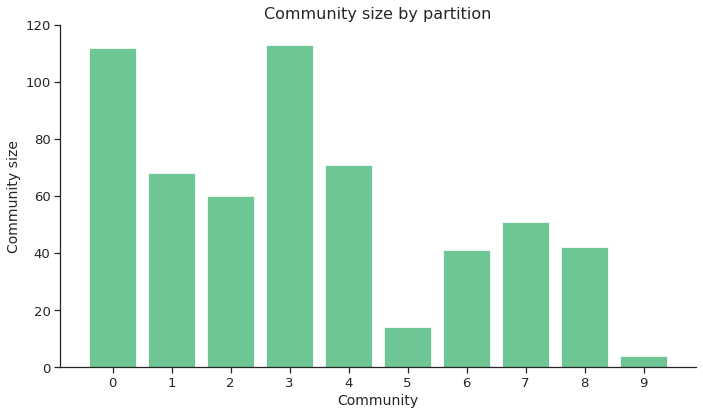

In [ ]:
# Plots
fig, ax1 = plt.subplots(1,1, figsize=(10, 6))

ax1.bar(list(partitions.keys()),community_size, facecolor='mediumseagreen', alpha=0.75, edgecolor="white")

ax1.set_ylabel("Community size", size=14)
ax1.set_xlabel("Community", size=14)
ax1.set_title("Community size by partition", size=16)
ax1.set_ylim(0,120)
ax1.set_xticks([i for i in range(0,10)])

fig.tight_layout()
sns.despine()
plt.show()

In total 10 communities are thus found in the network of genres. The distribution shows that some communities consist of more than 100 subgenres while others consist of less than 10.

To visualize which genres have been grouped inside each community, word clouds will be displayed. 
As input to the word cloud, the term frequency is applied, which simply means that the most frequent words also will be the biggest.
Therefore if a community contains *'classic rock', 'psychedelic rock'* and *'rock'*, and *rock* has the highest frequency, this will be the word that will help us name the community. 
As the community sizes varies between partitions the TF-IDF method is not applied as all genres are unique,
 and we want to visualize if the same words appear in different partitions (like pop or rock).

In [ ]:
TF_gen = {}
for key in partitions.keys():
    word_list = partitions[key]
    TF_word_list = FreqDist(word_list) # Get the TF for all words
    TF_gen[key] = TF_word_list

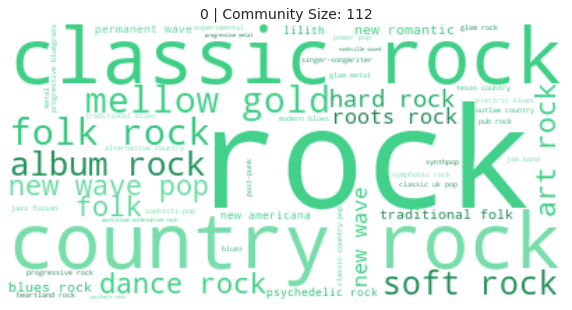

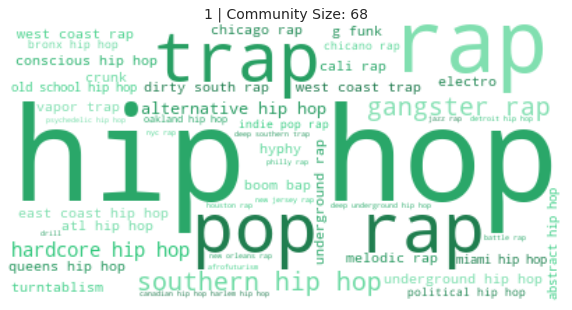

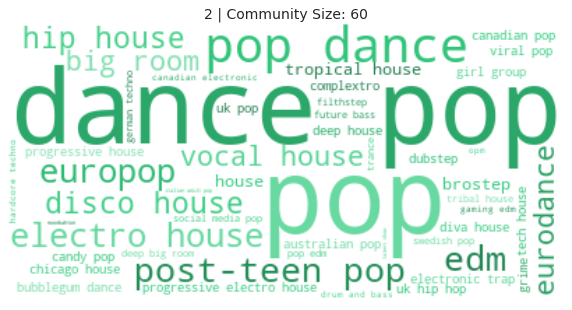

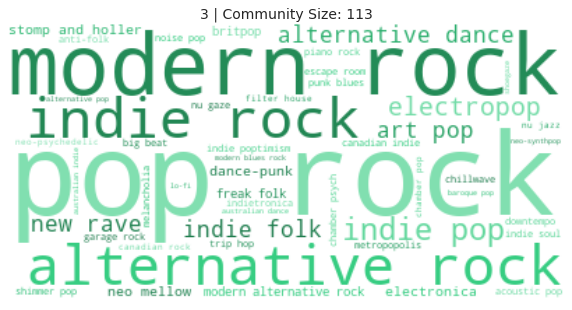

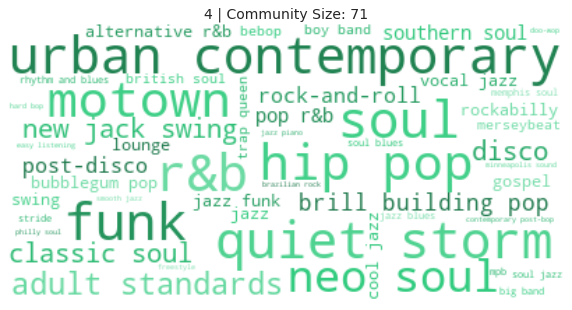

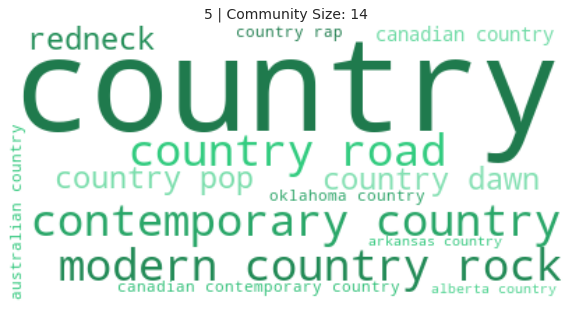

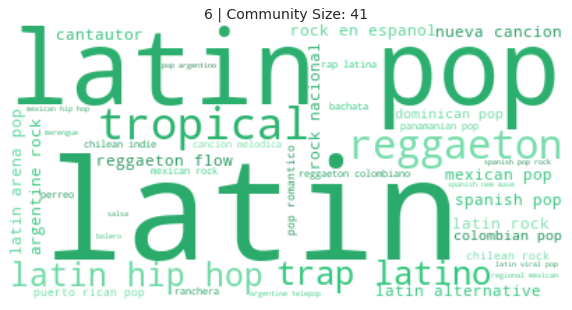

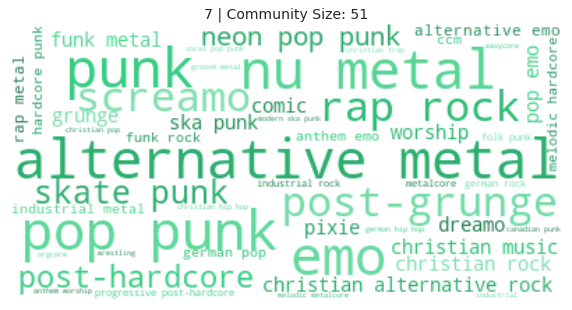

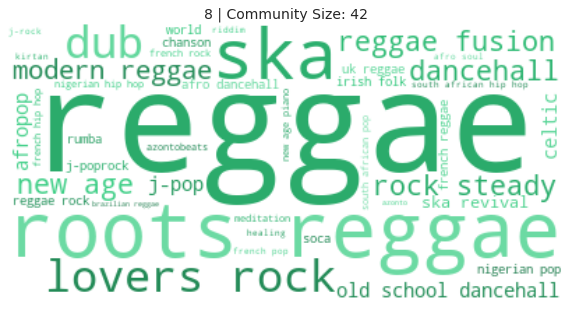

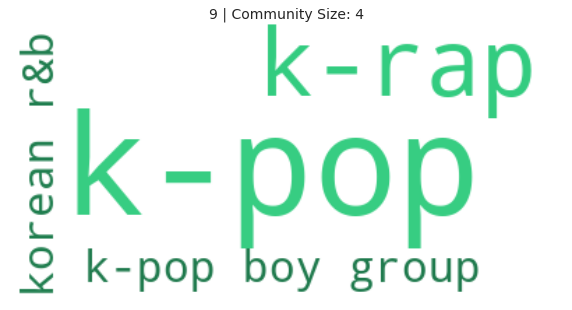

In [ ]:
for keys in TF_gen.keys():
    title = str(keys) + " | Community Size: " + str(Com_size[keys])
    show_wordcloud_gen(TF_gen[keys],title,nr_words = 50)

We can clearly see how each partition describes a family of genres. In fact it its possible to identify the communities by:

00 | Community Size: 112  - **ROCK**  
01 | Community Size: 68 - **HIP-HOP**  
02 | Community Size: 60 - **POP**  
03 | Community Size: 113 - **ALTERNATIVE**  
04 | Community Size: 71 - **FUNK-SOUL**  
05 | Community Size: 14 - **COUNTRY**  
06 | Community Size: 41 - **LATIN**  
07 | Community Size: 51 - **PUNK**  
08 | Community Size: 42 - **REGGAE**  
09 | Community Size: 4 - **K-POP**  











Therefore, a dictionary is created which links the partition number with the genre family.
This is used to identify the genre family of each of the genres associated with all the artists of the network.

In [ ]:
GEN_com = {0:"Rock", 1:"Hip-Hop", 2:"Pop", 3:"Alternative", 4:"Funk-Soul", 5:"Country", 6:"Latin", 7:"Punk", 8:"Reggae", 9:"K-Pop"}

In [ ]:
# Dictionary of genres and its respective genre family
GEN_fam = {}
for com in partitions:
    for gen in partitions[com]:
        GEN_fam[gen]=GEN_com[com]

In [ ]:
# Adding the Genre Community as attribute in the Genre Network
nx.set_node_attributes(G_gencC, values = GEN_fam, name = 'gen_family')

# Defining a priority list basded on community size, for the cases where the family genres have the same frequency.
GEN_byprio = ['K-Pop', 'Country','Reggae', 'Latin', 'Funk-Soul', 'Pop', 'Hip-Hop', 'Alternative', 'Rock']

In [ ]:
EMPT_ART = []
MULTG_ART = []
dic_ArtFamGen={}
for art in dic_ArtGen:
    temp_fam_gen = []
    for gen in dic_ArtGen[art]:
        try:
            temp_fam_gen.append(GEN_fam[gen])
        except:
            pass
    
    temp_dcounts = {x:temp_fam_gen.count(x) for x in temp_fam_gen}
    gen_sel = [gen for gen, cnt in temp_dcounts.items() if cnt == max(temp_dcounts.values())]
    
    if len(gen_sel)==0:
        EMPT_ART.append(art)
        
    elif len(gen_sel)>1:
        MULTG_ART.append(art)
        for gen_p in GEN_byprio:
            if gen_p in gen_sel:
                dic_ArtFamGen[art] = gen_p
                break
            else:
                pass    
    else:
        dic_ArtFamGen[art]= gen_sel[0]

In [ ]:
print(f"Number of Artists without genres: {len(EMPT_ART)} ({round(100*len(EMPT_ART)/len(dic_ArtGen),1)}%)")
print(f"Number of Artists with multiple genres in the same max frequency: {len(MULTG_ART)} ({round(100*len(MULTG_ART)/len(dic_ArtGen),1)}%)")

Number of Artists without genres: 261 (4.6%)
Number of Artists with multiple genres in the same max frequency: 370 (6.5%)


To identify the "main genre" of each artist, each sub-genre of an artist is replaced with the corresponding "main genre".
 For example, for *The Beatles* it is possible to replace the elements of the genre list:  
 -  From: *'beatlesque', 'british invasion', 'classic rock', 'merseybeat', 'psychedelic rock', 'rock'*  
 -  To:   *'Rock', 'Rock', 'Rock', 'Funk-Soul', 'Rock', 'Rock'*

And hereafter the "main genre" with the highest frequency is picked as the genre of the artist.

If an artists has more than one "main genre" with the same frequency,
 the genres with a smaller community size are prioritized. 
This assumption is built from the idea that if an artist has the same frequency for *Rock* and *Latin*,
 *Latin* is prioritized, as it is assumed the genre with the smallest community size will be more descriptive of the artist.
 This is the case for 6.5% of the artists. 

Additionally, for 4.6% of the artists, no family genre is identified.
 These are the artists that none of their sub-genres, from their original genres list,
  matched with the filtered set of genres inside in the partitions (due to the pre-filtering applied).
   At this stage, it is assumed that their genres where very specific genres and therefore did not add extra value to the analysis.
 Consequently, these artists were removed from the list. 

### Updating the Artist network with the family genre

Finally the network is then updated by assigning a genre to each artist.

In [ ]:
G_ArtGen = G.copy()

for elem in EMPT_ART:
    G_ArtGen.remove_node(elem)
    
nx.set_node_attributes(G_ArtGen, values = dic_ArtFamGen, name = 'genre') 

To close the analysis with the initial example, it is possible to see that *The Beatles* now have only one genre associated to them which matches our objective:

In [ ]:
print(G_ArtGen._node["3WrFJ7ztbogyGnTHbHJFl2"])

{'name': 'The Beatles', 'popularity': 89, 'genre': 'Rock'}


It is, however, necessary to consider that the genres assigned to each artist might not be 100% correct.
Some artist, for example, might both make *Rock* and *Pop* music which will not be taken into account in this analysis.
Therefore, the results and conclusion of the analysis should be evaluated with this in mind.

The Genres network is plotted with `ForceAtlas`, keeping the labels of the nodes for the two nodes with the highest degree for each genre. 

By inspecting the network, it is possible to see high degree nodes such as *rock*  and  *dance pop*. 
 Additionally, it is possible to see how the genres are interlaced. 
 For instance, *Rock*, *Alternative* and *Punk* are closely related, in some cases, it is possible to find nodes from one genre in the region of the other. 
 This makes sense since the three share some clear similarities.   
 
*Hip-Hop* instead is located in a separated area, and some nodes seem to be the connectors to other genres. On one side a node seems to act as a bridge with *Pop* and on the other side one with *Latin*. *Funk-Soul* is one of the genres that spreads the most throughout the network. 
This might indicate that it is the most unclear genre and that the artists associated with this genre might not have a very distinct style. 

![](/images/nw_genres.png)

Plot code: `nw_genres.ipynb`

Finally the network of genres, `G_GENcC.graphml`, is saved as well as the updated network of artists with the genre as an attribute, `G_ART_Gen.graphml`.

In [ ]:
""" 
# Saving the Artist Graph
# nx.write_graphml(G_ArtGen,"../../data/graphs/G_ARTGen.graphml",encoding='utf-8')

# Saving the Genres Graph
# nx.write_graphml(G_gencC,"../../data/graphs/G_GENcC.graphml",encoding='utf-8')
"""

' \n# Saving the Artist Graph\n# nx.write_graphml(G_ArtGen,"../../data/graphs/G_ARTGen.graphml",encoding=\'utf-8\')\n\n# Saving the Genres Graph\n# nx.write_graphml(G_gencC,"../../data/graphs/G_GENcC.graphml",encoding=\'utf-8\')\n'

With the genres added to the network step 3, 4 and 5 are then carried out and the final network after filtering is saved as `G_final.graphml`.

# 3. Network analysis

After gathering all information and performing the prefiltering, it is now possible to analyse the properties of the network.

The final graph obtained represents the network of collaborations, where nodes are artists and the edges are collaborations. 
This structure allows us to use the degree of the nodes as a measure of collaborations. 
Thus the degree of an artist will directly indicate the number of collaborations of this artist.

It is decided to work with the network as an undirected graph since a collaboration reflects if two artists have created a song together. 
 Therefore, creating a directed graph which indicates if a song was finally published in the album of one artist or the other does not add relevant information. After all, the analysis focuses on which factors influence artists to collaborate more. 

Once the descriptive elements have been clarified, we can proceed by importing the cleaned undirected graph:

In [14]:
# Importing the pre-filtered Graph with attributes
G_AC = nx.read_graphml("data/graphs/G_final.graphml") 


print("Number of nodes:",len(G_AC.nodes()))
print("Number of edges:", len(G_AC.edges()))
print(f"Graph Density: {round(nx.density(G_AC)*100,3)}%")

Number of nodes: 3098
Number of edges: 17155
Graph Density: 0.358%


The graph has a relatively low number of edges compared to the total number of nodes, as it can be observed when calculating the *density*. 
As a reference, a density of 0 will represent that the graph doesn't have any edges and a density of 1 will indicate that the graph is complete. 
The density formula follows $$ d = \frac{2m}{n\cdot(n-1)}$$, with $$m$$ being the number of egdes and $$n$$ the number of nodes 
[[ ref ]](https://networkx.org/documentation/stable/reference/generated/networkx.classes.function.density.html).
Therefore, a density of 0.36%, shows a low number of edges.

To further understand the characteristics of the network it is interesting to evaluate the *clustering
coefficient*. 

## Clustering Coefficient

Based on the research of [Watts and Strogatz (1998)](http://networksciencebook.com/chapter/2#paths), 
the clustering coefficient is the fraction of possible triangles that pass through a given node.
For undirected networks the clustering coefficient of a node can be calculated with $$c_u=\frac{2T(u)}{deg(u)(deg(u)-1)}$$ [[ ref ]](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.cluster.clustering.html#networkx.algorithms.cluster.clustering)
. The nodes with a clustering coefficient of 1 will be the nodes where all of their neighbours are connected, and contrary a node with a clustering coefficient of 0 will indicate that none of the neighbours are connected.

In our case, a node with a high clustering coefficient will indicate that most of the collaborators of the given node have collaborated between each other as well.


In [15]:
n_cc0 = [i for i in nx.clustering(G_AC).values() if i==0]
n_cc1 = [i for i in nx.clustering(G_AC).values() if i==1]

print("Average clustering coef:",round(nx.average_clustering(G_AC),3))
print(f"Min clustering coef: {min(nx.clustering(G_AC).values())} (Nº nodes:{len(n_cc0)})")
print(f"Max clustering coef: {max(nx.clustering(G_AC).values())} (Nº nodes:{len(n_cc1)})")

Average clustering coef: 0.122
Min clustering coef: 0 (Nº nodes:1396)
Max clustering coef: 1.0 (Nº nodes:63)


The average clustering coefficient of the network is not high, 
indicating that on average the collaborators of an artist do not necessarily collaborate. 
 63 nodes manage to have all their neighbours connected, $c_u = 1$, 
however, this only represents 2% of the nodes in the network.
On the other hand, 45% of the nodes in the network collaborate with artists that do not collaborate between them. 

This is an interesting characteristic of the collaborations network.
Thus to understand a bit better the clustering coefficients the are plotted against the degree.

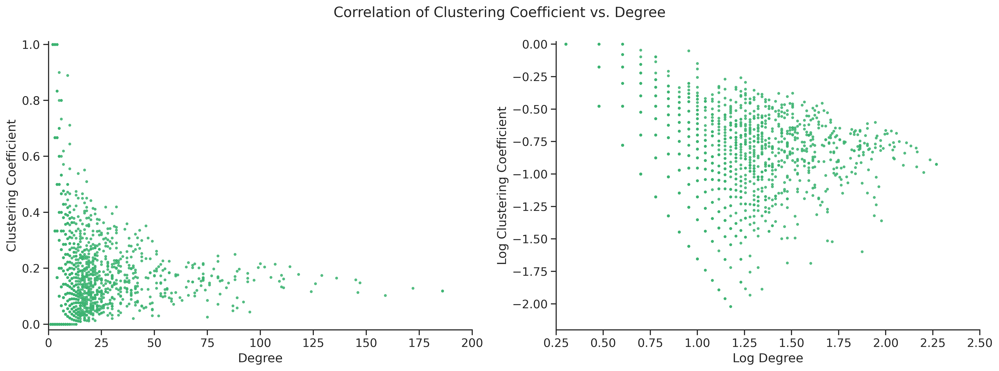

In [16]:
GAC_deg = [deg for nod,deg in G_AC.degree()]

GAC_cclog = [np.log10(cc) for cc in nx.clustering(G_AC).values() if cc>0] 
GAC_deglog = [np.log10(G_AC.degree[nod]) for nod,cc in nx.clustering(G_AC).items() if cc>0] 


fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Clustering Coefficient vs. Degree", size=16)

ax1.scatter(GAC_deg, nx.clustering(G_AC).values(), s=5, alpha=0.8, color = "mediumseagreen")

ax1.set_ylabel("Clustering Coefficient", size=14)
ax1.set_xlabel("Degree", size=14)
ax1.set_xlim((0, 200))
ax1.set_ylim((-0.02, 1.01))

ax2.scatter(GAC_deglog , GAC_cclog, s=5, alpha=0.8, color = "mediumseagreen")

ax2.set_ylabel("Log Clustering Coefficient", size=14)
ax2.set_xlabel("Log Degree", size=14)
ax2.set_xlim((0.25, 2.50))
ax2.set_ylim((-2.2, 0.02))

sns.despine()
fig.tight_layout()
plt.show()



In [ ]:
print("Correlation of Clustering Coefficient vs Degree:",round(np.corrcoef(list(nx.clustering(G_AC).values()), GAC_deg)[0,1],2))

Correlation of Clustering Coefficient vs Degree: 0.11


When plotting the clustering coefficient against the degree, no clear correlation is observed.
The plot, however, shows that the nodes with the highest clustering coefficient all are below a degree of 15.
 When it comes to the extremes, the clustering coefficient of 1 or 0, the degree is also relatively low.
 It can also be observed that for the artists with a very high degree the clustering coefficient is generally below 0.3. 
 This does however also makes sense as if an artist is connected to more then 50 artists the chance that all of these artists have also worked together will be small.

The logarithmic transformation of the plot does not show any clear correlation between the two.
 This is also backed up by the Pearson correlation which is close to 0. 
 The low correlation level might be related to the outliers for the degree.
 
To finalise the evaluation of the clustering coefficient the average clustering coefficient of the genres is calculated.

In [ ]:
nod_genre = sorted([(nod, G_AC._node[nod]['genre']) for nod in G_AC.nodes()], key=lambda x: x[1], reverse=True)

print("Average Clustering by Genre:")
for gen in set([gen for nod,gen in nod_genre]):
    nod_it = [nod for nod,gen_it in nod_genre if gen_it ==gen]
    avclust_gen = nx.average_clustering(G_AC, nodes = nod_it)
    n1_gen = list(nx.clustering(G_AC, nodes = nod_it).values()).count(1)
    print(f"  {gen} | Av.clust.coef: {round(avclust_gen,3)} | Nº nodes(cu=1): {n1_gen}")

Average Clustering by Genre:
  Country | Av.clust.coef: 0.113 | Nº nodes(cu=1): 11
  Rock | Av.clust.coef: 0.079 | Nº nodes(cu=1): 13
  Punk | Av.clust.coef: 0.107 | Nº nodes(cu=1): 8
  Pop | Av.clust.coef: 0.11 | Nº nodes(cu=1): 4
  Hip-Hop | Av.clust.coef: 0.222 | Nº nodes(cu=1): 8
  Reggae | Av.clust.coef: 0.192 | Nº nodes(cu=1): 6
  Funk-Soul | Av.clust.coef: 0.113 | Nº nodes(cu=1): 6
  Alternative | Av.clust.coef: 0.049 | Nº nodes(cu=1): 7


We can observe that all genres keep a clustering average below 0.25, therefore there is not a big disparity between the genres.
The genres with the highest clustering coefficient is *Hip-Hop* (0.22) which could indicate that the artists for this genre might have a stronger 
linkage between them and therefore, a tendency to co-create more between each other. 
Nevertheless, to validate this point it will be interesting to analyse the collaborations by genre, 
and focus on analysing if there is a strong collaboration within the same genre or towards other genres. 
This analysis will be performed in the section *How do artist collaborate*.

In [ ]:
df_artist_info.head()

,artist,artist_id,genre,sentiment,year,degree
0,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.551358,1981,2
1,Paul McCartney,4STHEaNw4mPZ2tzheohgXB,Rock,5.711872,1986,21
2,Rakim,3PyWEKLWI0vHPmoNrIX0QE,Hip-Hop,5.373357,2002,20
3,12th Planet,3V1h3kAdiVDBiwlY2i6dJz,Pop,5.593255,2017,6
4,Skrillex,5he5w2lnU9x7JFhnwcekXX,Pop,5.371399,2014,48


### Centrality

To measure the centrality of the graph we can use the *betweenness centrality* which is based on the network shortest paths, 
and it is widely used when evaluating social networks [[ref]](https://en.wikipedia.org/wiki/Betweenness_centrality). 

The *betweenness centrality* captures how much a given node is in-between others. 
 This metric is calculated with the number of shortest paths (between any couple of nodes in the graphs) that passes through the target node.
 The target node would have a high betweenness centrality if it appears in many shortest paths [[ref]](https://www.sciencedirect.com/topics/computer-science/betweenness-centrality).

Accordingly, it can be calculated with: $$c_b(v) = \sum_{s,t \epsilon V} \frac{\sigma (s,t|v)}{\sigma (s,t)}$$, 
 where $$V$$ is the set of nodes, $$\sigma(s, t)$$ is the number of shortest $(s, t)$ paths, and $$\sigma(s, t|v)$$
  is the number of those paths passing through some node $$v$$ other than $$s, t$$ [[ref]](https://networkx.org/documentation/networkx-1.10/reference/generated/networkx.algorithms.centrality.betweenness_centrality.html). 

Therefore, we can get the *betweenness centrality* for all the nodes in the network and observe the properties of the most central nodes.

In [18]:
# get betweennes centrality
bet_cen = nx.betweenness_centrality(G_AC)

In [ ]:
# print most central nodes
s_bet_cen =  sorted(bet_cen.items(), key=lambda x: x[1], reverse=True)

print("Top 10 most central artists:")
for nod,bc in s_bet_cen[:10]:
    print(f"{G_AC._node[nod]['name']} | Betweenes Cent: {round(bc,3)} | Degree: {G_AC.degree[nod]} | Popularity: {G_AC._node[nod]['popularity']} | Genre: {G_AC._node[nod]['genre']}")

Top 10 most central artists:
Willie Nelson | Betweenes Cent: 0.042 | Degree: 95 | Popularity: 76 | Genre: Rock
Paul Oakenfold | Betweenes Cent: 0.029 | Degree: 75 | Popularity: 57 | Genre: Alternative
Tiësto | Betweenes Cent: 0.026 | Degree: 89 | Popularity: 85 | Genre: Pop
Steve Aoki | Betweenes Cent: 0.025 | Degree: 87 | Popularity: 81 | Genre: Pop
Elton John | Betweenes Cent: 0.024 | Degree: 49 | Popularity: 86 | Genre: Rock
Busta Rhymes | Betweenes Cent: 0.023 | Degree: 159 | Popularity: 80 | Genre: Hip-Hop
Pitbull | Betweenes Cent: 0.019 | Degree: 92 | Popularity: 86 | Genre: Pop
Diplo | Betweenes Cent: 0.019 | Degree: 87 | Popularity: 88 | Genre: Pop
Dolly Parton | Betweenes Cent: 0.019 | Degree: 49 | Popularity: 77 | Genre: Country
Lil Wayne | Betweenes Cent: 0.019 | Degree: 186 | Popularity: 92 | Genre: Hip-Hop


We can observe that the most central nodes are not restricted to one genre and their popularity ranges
from 57 to 92, therefore the most central nodes do not appear necessarily to be the most popular. 
 However, there is a common pattern between them; to illustrate it we can take one example:

*Pitbull* is an American singer, that especially is known for featuring in other artists singles, in fact, *Billboard* considers him 
*"the king of collaborations"* [[ ref ]](https://www.billboard.com/articles/columns/pop/8550769/pitbull-weirdest-collaborations-blake-shelton-michael-jackson).
 Even if we don't know what the editors of Billboard exactly mean when they talk about *the king*, we can confirm that he is indeed a central element,
 being one connecting point between artists.

However, on his Wikipedia page, it is mentioned that *"Pitbull has the most collaborations among any other music artist"* [[ ref ]](https://en.wikipedia.org/wiki/Pitbull_discography).
At this stage, we can only talk about his high centrality to confirm he has the most number of collaborations we would need to confirm that he is as well in the highest degree range. A degree of 92, shows that he is in the upperside, but in section *How do artists collaborate?*,
 we will confirm if he is as well between the top 10 collaborators.

Nonetheless, by plotting the degree together with the centrality, we can evaluate if there is a relation between the two:


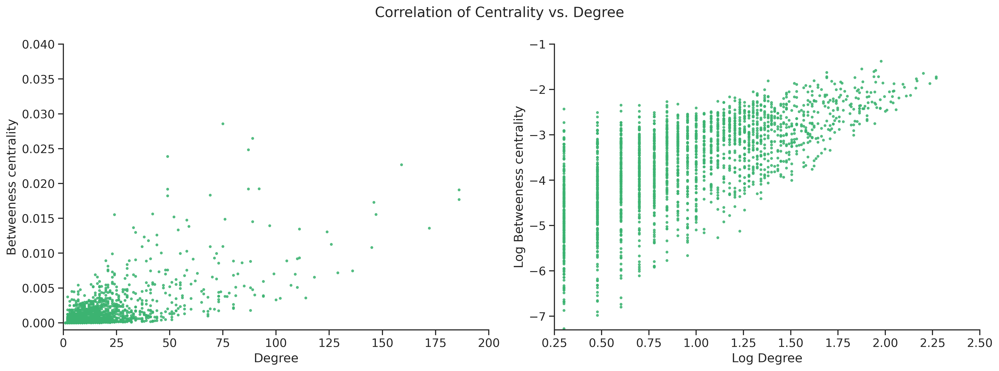

In [19]:
GAC_bc = [bc for nod,bc in bet_cen.items()]
GAC_bclog = [np.log10(bc) for bc in GAC_bc if bc>0] 
GAC_deglog = [np.log10(G_AC.degree[nod]) for nod,bc in bet_cen.items() if bc>0] 

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality vs. Degree", size=16)

ax1.scatter(GAC_deg, GAC_bc, s=5, alpha=0.8, color = "mediumseagreen")

ax1.set_ylabel("Betweeness centrality", size=14)
ax1.set_xlabel("Degree", size=14)
ax1.set_xlim((0, 200))
ax1.set_ylim((-0.001, 0.04))


ax2.scatter(GAC_deglog ,GAC_bclog, s=5, alpha=0.8, color = "mediumseagreen")

ax2.set_ylabel("Log Betweeness centrality", size=14)
ax2.set_xlabel("Log Degree", size=14)
ax2.set_xlim((0.25, 2.50))
ax2.set_ylim((-7.3, -1))

sns.despine()
fig.tight_layout()
plt.show()


In [ ]:
print("Correlation of Centrality vs Degree:", round(np.corrcoef(GAC_bc, GAC_deg)[0,1],2))

Correlation of Centrality vs Degree: 0.7


By looking at the logarithmic transformation it is possible to detect a direct relationship between the two. Nodes with a higher degree will have higher betweenness centrality. The correlation between the two reaches a level of almost 0.7, 
 confirming the strong relationship between both parameters.

## Degree Distribution

The degree distribution of a network can provide key knowledge concerning the characteristics of the network.
But in our case, this distribution will especially be relevant due to the direct relationship between the degree and the questions we want to answer about collaboration.

Let's start by observing the distribution and plotting the basic statistics.

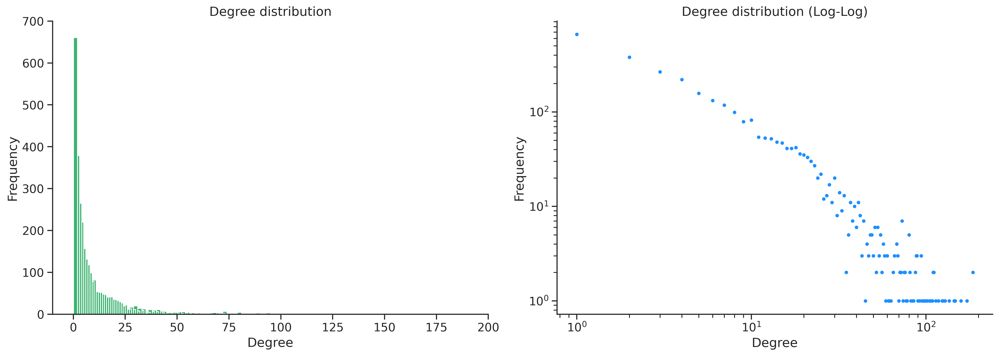

In [23]:
# Using degree_dist function from %useful_functions
degree_dist(G_AC)

In [ ]:
# Using degree_stats function from %useful_functions
degree_stats(G_AC)

Average: 11.075
Median: 5.0
Mode: 1
Max: 186
Min: 1


The median degree is relatively low compared to the max value that few artists have. 
 This is especially clear when looking at the highly skewed histogram, which resembles an exponential decay
with high frequencies on low degrees and low frequencies for high degrees.  

When looking at the logarithmic transformation, it is possible to see how the scatterplot follows an almost straight line. This is a characteristic of networks that follow a *power-law distribution*.

To validate if indeed the networks follows a *power-law distribution*, where most nodes have lower degree but some nodes are extreme, the exponent $\gamma$ can be calculated:

In [ ]:
gamma = powerlaw.Fit(GAC_deg, discrete=False, verbose=False).alpha
print("Degree exponent (gamma):",round(gamma,3))

Degree exponent (gamma): 2.64


Following the descriptions from [Albert, Jeong and Barabási (1999)](http://networksciencebook.com/chapter/4#universality),
 the dependence of the average distance 〈 d 〉 on the system size and the degree exponent, 
 defines 4 different regions that allow us to describe the properties of a network. 

 A degree exponent of $2.64$, falls in the *Ultra-Small-World* $(2 < \gamma < 3)$,
 in this regime, the hubs radically reduce the path length.
 This means that if we would increase the number of artists in our network,
 the average distance would increase with the rate of $ln(ln(N))$, which is significantly slower growth than the $ln(N)$ for random networks.

Furthermore, the degree exponent describes as well the properties of Scale-Free Networks. When $2 < \gamma < 3$, 
the network falls in the Scale-Free regime, where $k_{max}$ grows with the size of the network with 
exponent $\frac{1}{\gamma - 1}$. Indicating that the degree of our network indeed follows a *power-law distribution*.

It is not surprising that the collaborations between artists follow a *power-law distribution*, 
 one would expect that the way artists collaborate should not differ a lot from how scientist collaborate between each other (citations network),
 which is a known *power-law* network [[ref]](https://www.youtube.com/watch?v=myLgzbXxhOQ&feature=emb_title&ab_channel=SuneLehmann). 
 
 However, to understand which characteristics the extreme nodes share, it will be interesting to add in our analysis of
 collaborations a comparison between the extreme nodes and the rest. 
 To do so we can make the definition that artists that have more than 25 collaborations are categorized as Top Collaborators. 
  Marking the barrier at $degree \geq 25$  allows us to have a sample that reaches 10% of the data for the extreme nodes.
  Thus a sample big enough to perform comparisons, while still portraying the behaviour of the top range.

After characterising the network and identifying important elements, we can start the analysis of how artist collaborate.

# 4. How do artists collaborate?
In this section of the notebook we will try to answer the questions that started the project; How do the artists of the network collaborate?
This will be explored in 4 different ways:

1.  Popularity - Are the artists that collaborate the most the ones with the highest popularity? 
1.  Genre - Do artists from certain genres collaborate more than others? 
1.  Sentiment - Are the lyrics of the artist who collaborate sadder/happier than the rest?
1.  Time - Has the amount of collaborations changed through the history of time?

To answer some of these questions the artists are divided into two subsets as described above. 
One subset of the artist belonging to the top collaborators (with a degree of 25 or higher) and one subset for the rest of the artist (with a degree below 25).

In [ ]:
# Marking the barrier between top collaborators and others.
top_collab_deg = [deg for nod,deg in G_AC.degree if deg >= 25]
rst_collab_deg = [deg for nod,deg in G_AC.degree if deg < 25]

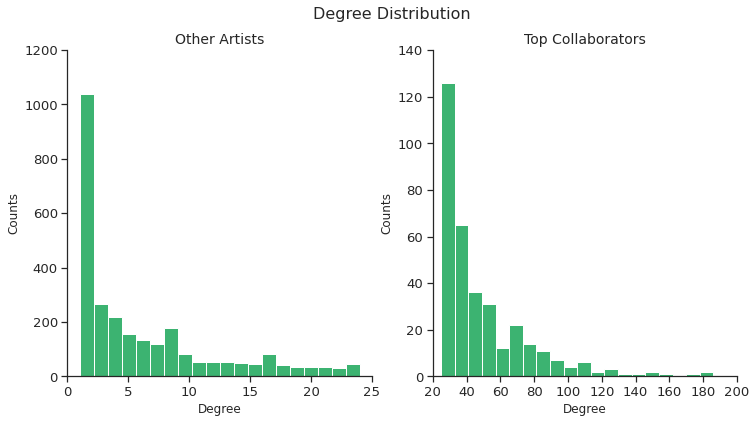

In [ ]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2, figsize=(12,6))

with sns.axes_style("whitegrid"):

    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})

    ax1.hist(rst_collab_deg,bins=20, color = "mediumseagreen")
    ax2.hist(top_collab_deg,bins=20, color = "mediumseagreen")

    ax1.set_xlabel("Degree", size= 12)
    ax1.set_ylabel("Counts", size = 12)
    ax1.set_title("Other Artists", size= 14)
    ax1.set_xlim(0,25)
    ax1.set_ylim(0,1200)

    ax2.set_xlabel("Degree", size= 12)
    ax2.set_ylabel("Counts", size = 12)
    ax2.set_title("Top Collaborators", size= 14)
    ax2.set_xlim(20,200)
    ax2.set_ylim(0,140)

    fig.suptitle("Degree Distribution", fontsize=16)

    sns.despine()

plt.show()

In [ ]:
# Using degree_stats function from %useful_functions

print( "----TOP COLLABORATORS-----""")
basic_stats(top_collab_deg, ratio=True, r=len(G_AC.nodes))

print("\n---- OTHER ARTISTS-----")
basic_stats(rst_collab_deg, ratio=True, r=len(G_AC.nodes))

----TOP COLLABORATORS-----
  N:  347 (11.2%)
  Variance 800.11
  Average: 49.74
  Median: 39.0
  Max: 186
  Min: 25

---- OTHER ARTISTS-----
  N:  2751 (88.8%)
  Variance 35.83
  Average: 6.2
  Median: 4.0
  Max: 24
  Min: 1


When dividing the network into subgroups it is possible to observe the differences between two
 regions of the *power-law distribution*: the high degree and low frequency (Top collaborators) against 
 low degree and high-frequency ones (Other artists).
 These two sub-groups will be used to observe the different behaviours of the 4 variables of the study.
 
If we take a look at the distributions of the Top collaborators against the Other artists, it is possible to observe that both maintain the highly skewed distribution. However, and as expected, the frequencies are very different, from a 
maximum frequency of 125 for the top collaborators to a range of more than 1000 for the other artists. Accordingly, 
there are some important changes on the basic statistics of the two groups, the top collaborators has a median degree of 39 and a variance of 800
and the other artists a median as low as 4 and a variance of 34.

Once the characteristics of the two groups have been presented, it is interesting to take a look on the top collaborators of our network and 
 see if we can already identify some patterns:

In [ ]:
degree_sorted = sorted(G_AC.degree, key=lambda x: x[1], reverse=True)

print("Top 10 Collaborators:")
for nod_deg in degree_sorted[:10]:
    nod,deg = nod_deg
    print(f"{G_AC._node[nod]['name']} | Degree: {deg} | Popularity: {G_AC._node[nod]['popularity']} | Genre: {G_AC._node[nod]['genre']}")

Top 10 Collaborators:
Lil Wayne | Degree: 186 | Popularity: 92 | Genre: Hip-Hop
Gucci Mane | Degree: 186 | Popularity: 84 | Genre: Hip-Hop
Rick Ross | Degree: 172 | Popularity: 83 | Genre: Hip-Hop
Busta Rhymes | Degree: 159 | Popularity: 80 | Genre: Hip-Hop
T.I. | Degree: 147 | Popularity: 81 | Genre: Hip-Hop
E-40 | Degree: 146 | Popularity: 73 | Genre: Hip-Hop
French Montana | Degree: 145 | Popularity: 82 | Genre: Hip-Hop
The Game | Degree: 136 | Popularity: 77 | Genre: Hip-Hop
Chris Brown | Degree: 129 | Popularity: 92 | Genre: Pop
Wiz Khalifa | Degree: 126 | Popularity: 88 | Genre: Hip-Hop


If we look at the popularity of the top 10 collaborators, it is possible to see that they all have popularity higher than 73. 
The artists are not strictly the most popular, but still, an interesting point that we will later deep dive-on.

More interesting is that all except one artist are from the genre *Hip-Hop*. 
We could already make some hypothesis, will Hip-Hop artists be the ones that have more collaborations? This is motivating, 
it looks as we are indeed up to something.

It is as well interesting to see that only two of the most central artists appear as well in the top collaborators *Lil Wayne* and *Busta Rhymes*.
Following the example used when evaluating centrality, we can confirm that even if *Pitbull* is considered the *king of collaborations*, 
this is only about his central position in the network of artists and not about his volume of collaborations, since the above artists 
have more collaborations.

## 4.1. Collaborations vs. Popularity

In this section, the question *Are the artists that collaborate the most, the ones with the highest popularity?* is looked further into.
The popularity is a measure calculates by Spotify and is a value between 0 and 100, where 100 is the most popular.
For the artist, the measure is based on the popularity of all the artist's tracks, which is based on the total number of plays of the track and how recent these plays are.

To answer the question we initially will take a look at the distribution of popularity.

In [ ]:
nod_popularity = sorted([(nod, G_AC._node[nod]['popularity']) for nod in G_AC.nodes()], key=lambda x: x[1], reverse=True)
popularity = [pop for nod,pop in nod_popularity]
degree = [G_AC.degree[nod] for nod,pop in nod_popularity]

pop_h = [pop for nod,pop in nod_popularity if pop >= 70]
deg_h = [G_AC.degree[nod] for nod,pop in nod_popularity if pop >= 70]

pop_r = [pop for nod,pop in nod_popularity if pop < 70]
deg_r = [G_AC.degree[nod] for nod,pop in nod_popularity if pop < 70]

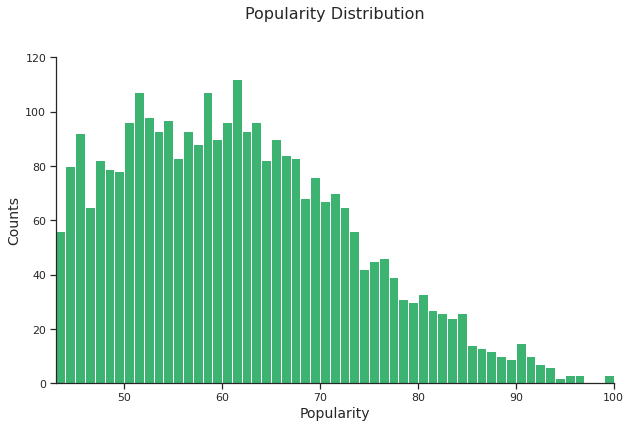

In [ ]:
# plot popularity distribution
fig, ax = plt.subplots(1, figsize=(10,6))
with sns.axes_style("whitegrid"):
    # plt.rcParams['figure.dpi'] = 360
    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})
    ax.hist(popularity,bins=57, color = "mediumseagreen")
    ax.set_xlabel("Popularity", size= 14)
    ax.set_ylabel("Counts", size = 14)
    ax.set_title("Popularity Distribution", size= 16, y=1.1)
    ax.set_ylim((0, 120))
    ax.set_xlim((43,100))
    ax.set_yticks(np.arange(0, 120+1, step=20))
    sns.despine()
plt.show()

In [ ]:
# Using degree_stats function from %useful_functions

print("Popularity distribution")
basic_stats(popularity)
# print("\n""Most Popular Artists")
# basic_stats(pop_h)
# print("\n""Other Artists with popularity level <70% ratio")
# basic_stats(pop_r)

Popularity distribution
  N:  3098
  Variance 133.85
  Average: 61.24
  Median: 60.0
  Max: 100
  Min: 43


Looking at the distribution of the popularity it can be seen that no popularity is below 43.
The reason for this is that during the pre-processing steps artists with less than a popularity of 43 were removed.
 This allowed us to focus on a workable, but still high, number of artists that represent a set of known musicians from which some might be worldwide famous and other would still have a relatively small fan-base.

Focusing on our data-set, the Popularity follows a skewed distribution with a median of 60 and variance of 134, therefore the majority of artists will 
fall bellow a popularity level of 70. 

However, before studying the correlation between collaboration and popularity, let's first take a quick look at the top 10 most popular artists:

In [ ]:
print("Top 10 most popular artists:")
for nod_pop in nod_popularity[:10]:
    nod,pop = nod_pop
    print(f"{G_AC._node[nod]['name']} | Popularity Ratio: {pop} | Degree: {G_AC.degree[nod]} | Genre: {G_AC._node[nod]['genre']}")

Top 10 most popular artists:
Drake | Popularity Ratio: 100 | Degree: 73 | Genre: Hip-Hop
Juice WRLD | Popularity Ratio: 99 | Degree: 21 | Genre: Hip-Hop
Ariana Grande | Popularity Ratio: 99 | Degree: 25 | Genre: Pop
Justin Bieber | Popularity Ratio: 96 | Degree: 50 | Genre: Pop
Travis Scott | Popularity Ratio: 96 | Degree: 65 | Genre: Hip-Hop
The Weeknd | Popularity Ratio: 96 | Degree: 40 | Genre: Pop
Taylor Swift | Popularity Ratio: 95 | Degree: 15 | Genre: Pop
Post Malone | Popularity Ratio: 95 | Degree: 30 | Genre: Hip-Hop
DaBaby | Popularity Ratio: 95 | Degree: 37 | Genre: Hip-Hop
Eminem | Popularity Ratio: 94 | Degree: 56 | Genre: Hip-Hop


We can see that the top 10 most popular artist are not the same as the top 10 collaborators.
None of the artists identified before appear in the top 10 most popular artist list. 
However, *Hip-Hop* is still the genre with more representation closely followed by *Pop*. 

Perhaps, the most interesting element is the wide range of different degrees.
 The degrees, which mark the number of collaborations go from 73 for Drake, the most popular artist, to as low as 15, for Taylor Swift. 
 Indicating that popularity might not have anything to do with how much the artist collaborate.

To quantify this further the correlations between the popularity and amount of collaborations is checked.

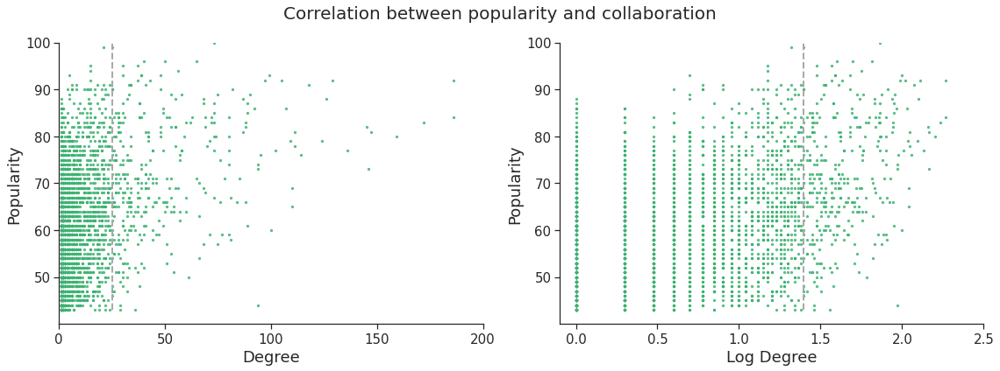

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16,6))

with sns.axes_style("white"):
    
    sns.set_context("notebook")

    ax1.scatter(deg_h,pop_h,s=5, alpha=0.8, color = "mediumseagreen")
    ax1.scatter(deg_r,pop_r,s=5, alpha=0.8, color = "mediumseagreen")
    ax1.plot([25, 25], [43, 100], color='darkgrey', linestyle='--', linewidth=2)

    ax1.tick_params(axis = "both",labelsize = 15 )
    ax1.set_ylabel("Popularity", size=18)
    ax1.set_xlabel("Degree", size=18)

    top = ax2.scatter(np.log10(deg_h),pop_h,s=5, alpha=0.8, color = "mediumseagreen")
    rest = ax2.scatter(np.log10(deg_r),pop_r,s=5, alpha=0.8, color = "mediumseagreen")
    line = ax2.plot([np.log10(25), np.log10(25)], [43, 100], color='darkgrey', linestyle='--', linewidth=2)

    ax2.tick_params(axis = "both",labelsize = 15 )
    ax2.set_ylabel("Popularity", size=18)
    ax2.set_xlabel("Log Degree", size=18)
    
    ax1.set_xlim((0, 200))
    ax1.set_xticks(np.arange(0, 201, step=50))
    ax1.set_ylim((40, 100))
    ax1.set_yticks(np.arange(50, 101, step=10))

    ax2.set_xlim((-0.1, 2.5))
    ax2.set_xticks(np.arange(0, 2.51, step=0.5))
    ax2.set_ylim((40, 100))
    ax2.set_yticks(np.arange(50, 101, step=10))

    # ax2.legend((top, rest),("Top by Popularity", "Other Artists"),loc="best", prop={'size': 14}, bbox_to_anchor=(1.02, 0.965), frameon=False)

    fig.suptitle("Correlation between popularity and collaboration", fontsize=20)

sns.despine()
fig.tight_layout()
plt.show()

In [ ]:
print("Correlation Matrix: Popularity vs Degree")
print(np.corrcoef(popularity, degree))

Correlation Matrix: Popularity vs Degree
[[1.         0.37857588]
 [0.37857588 1.        ]]


The correlation between popularity and degree is 0.38, which indicates a weak relation between the two variables.
However, it is possible to observe that the nodes with the highest degree behave differently than the lowest ones.
The popularity of the artist with a lower degree will range greatly but for the top collaborators, the popularity increases with the increase of degree. 
This change of behaviour happens around degree 25 (indicated by a vertical grey dotted line), 
which is also the threshold set earlier that separates top collaborators from the rest.

To further understand this behaviour, the two subgroups top collaborators and the rest are evaluated separately.

In [ ]:
top_collab_pop = [pop for nod,pop in nod_popularity if G_AC.degree[nod] >= 25]
rst_collab_pop = [pop for nod,pop in nod_popularity if G_AC.degree[nod] < 25]

In [ ]:
# Using degree_stats function from %useful_functions

print( "----TOP COLLABORATORS-----")
basic_stats(top_collab_pop)
print("\n""Correlation Matrix: Popularity vs Degree")
print(np.corrcoef(top_collab_pop, top_collab_deg))

print("\n---- OTHER ARTISTSs-----")
basic_stats(rst_collab_pop)
print("\n""Correlation Matrix: Popularity vs Degree")
print(np.corrcoef(rst_collab_pop, rst_collab_deg))

----TOP COLLABORATORS-----
  N:  347
  Variance 150.54
  Average: 71.56
  Median: 71.0
  Max: 100
  Min: 43

Correlation Matrix: Popularity vs Degree
[[1.         0.32976521]
 [0.32976521 1.        ]]

---- OTHER ARTISTSs-----
  N:  2751
  Variance 116.61
  Average: 59.94
  Median: 59.0
  Max: 99
  Min: 43

Correlation Matrix: Popularity vs Degree
[[1.         0.42587151]
 [0.42587151 1.        ]]


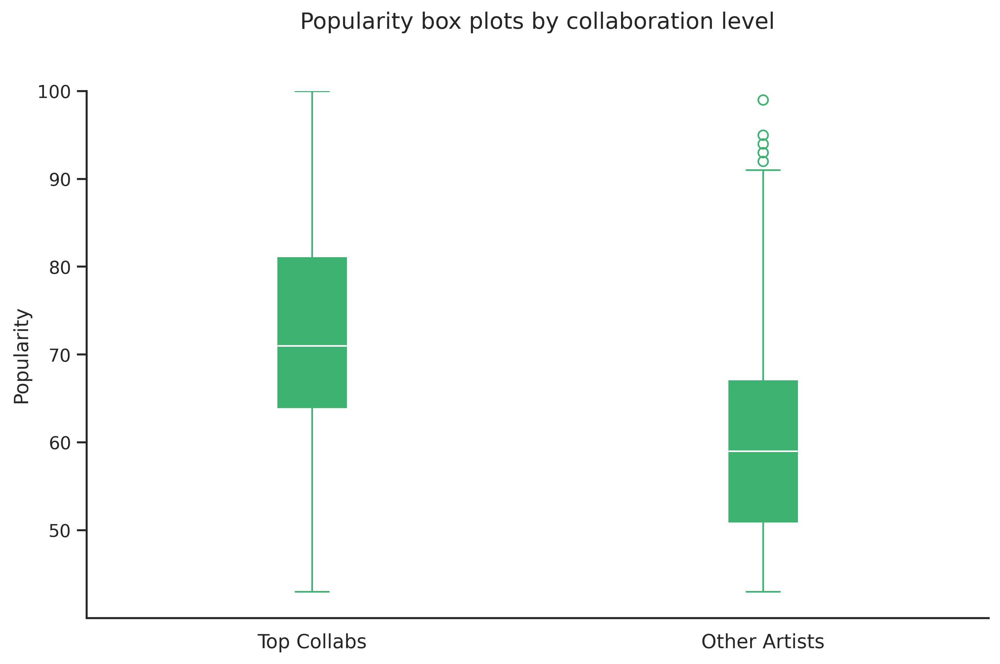

In [ ]:
fig, ax1 = plt.subplots(1, figsize=(10,6))

with sns.axes_style("white"):
    
    plt.rcParams['figure.dpi'] = 360
    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})
    
    c= "mediumseagreen"
    ax1.boxplot([top_collab_pop, rst_collab_pop], patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color="white"),
            )

    ax1.set_xticklabels(["Top Collabs", "Other Artists"], size=12)
   
    ax1.set_ylim((40, 100))
    ax1.set_yticks(np.arange(50, 101, step=10))
    ax1.set_ylabel("Popularity", size=12)
    ax1.xaxis.set_ticks_position('none')

    ax1.set_title("Popularity box plots by collaboration level", size=14, y=1.1)

    sns.despine()

plt.show()


By analyzing the Boxplots it is possible to see differences between the two groups. 
The median of the top collaborators is 71 which is higher than the median for the other artists, 59. 

However, there is a bigger difference between the interquartile ranges of the boxplots (which considers the data between Q1 and Q3).
The top collaborators first and third quantiles fall between 63 and 81 popularity levels.
This is relatively higher than the boxplot for the other artists, that ranges between 52 and 67.

 This indicates that the artists with a popularity ratio higher than 70 will most likely belong to the top collaborators. 
 However, some outliers can be found among the other artists, such as Taylor Swift, that even with her high popularity only collaborated with 15 artists of the network. 
 The minimum and maximum range of the top collaborators shows that artists with a high number of collaborations could also have lower popularity levels.
 
In conclusion the analysis showed that the level of collaborations does not rely directly on the popularity of an artist (not a strong correlation).
However, generally, it was found that artists with a higher level of popularity will most likely also have more collaborations. 
It should also be taken into account that only artists with a popularity above 43 are included, thus if artists with all levels of popularity the correlation might be stronger.

## 4.2. Collaborations vs. Genres
From the previous section, it was found that the top 10 collaborators mostly belong to the *Hip-Hop* genre.
In this section the objective is, therefore, to see if this is a general trend, how collaborations level and genre relate to each other and thereby answering the question: *Do artists from certain genres collaborate more than others?*.   

The first step will be to inspect the degree distribution of every genre.

In [26]:
# Getting the degrees of the nodes in each Genre
nod_genre = sorted([(nod, G_AC._node[nod]['genre']) for nod in G_AC.nodes()], key=lambda x: x[1], reverse=True)
set_gen = set([G_AC._node[nod]['genre'] for nod in G_AC.nodes()])

dic_GenDeg = {}
for gen in set_gen:
    deg_g = [G_AC.degree[nod] for nod in G_AC.nodes() if G_AC._node[nod]['genre'] == gen]
    dic_GenDeg[gen] = deg_g

sort_vol = sorted([(gen, len(dic_GenDeg[gen])) for gen in set_gen], key=lambda x: x[1], reverse=True)
sort_gen = [gen for gen,n in sort_vol]

items_GenDeg = sorted([(gen, ldeg) for gen,ldeg in dic_GenDeg.items()], key=lambda x: len(x[1]), reverse=True)
all_stack_GenDeg = [ldeg for gen,ldeg in items_GenDeg]

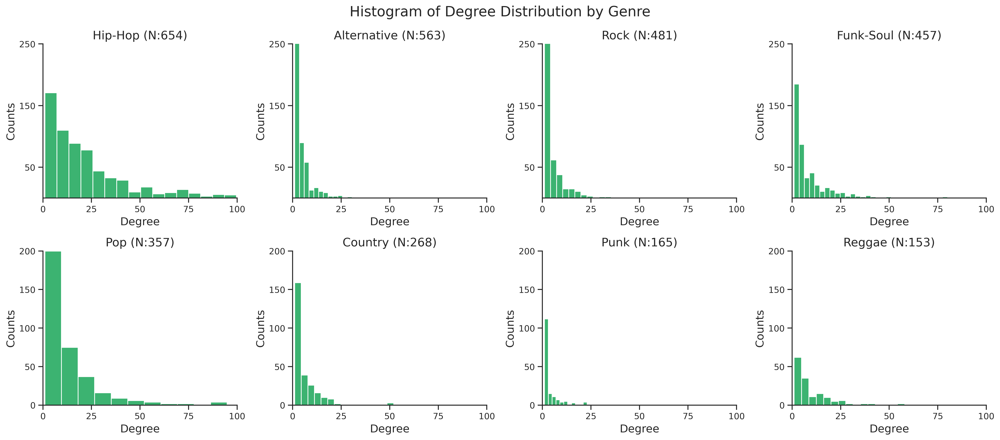

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(18, 8))
fig.suptitle("Histogram of Degree Distribution by Genre", fontsize=18)

with sns.axes_style("white"): 
    # plt.rcParams['figure.dpi'] = 360
    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})    
    
    i = 0
    for row in axes:
        for ax in row:
            gen = sort_gen[i]

            if i < 4:
                ax.hist(dic_GenDeg[gen], bins=30, color = "mediumseagreen")
                ax.set_xlim((0, 100))
                ax.set_ylim((0, 250))
                ax.set_yticks(np.arange(50, 251, step=100))
            else:
                ax.hist(dic_GenDeg[gen], bins=15, color = "mediumseagreen")
                ax.set_xlim((0, 100))
                ax.set_ylim((0, 200))
                ax.set_yticks(np.arange(0, 201, step=50))

            ax.set_xticks(np.arange(0, 101, step=25))

            ax.set_xlabel("Degree", size= 14)
            ax.set_ylabel("Counts", size = 14)
            ax.set_title(gen+" (N:"+str(len(dic_GenDeg[gen]))+")", size= 15)
            sns.despine()
            
            i+=1

fig.tight_layout()
plt.show()


Looking at the distribution of the degree by genre, it is possible to see how the *power-law distribution* 
 is maintained for all genres.
 As the degree increases the frequency of artists drops, but still there are some differences between them. 

The distribution for *Hip-Hop* artists is wider, with a smaller number of artists at lower degrees compared to other genres with a similar number of nodes, 
 such as *Alternative and Rock*. Furthermore, *Hip-Hop* is the only genre that reaches to degrees higher than 100 (not displayed in the histogram, to make comparison easier). 
 *Pop* follows *Hip-Hop* with a continued number of nodes reaching a degree of 50. 
 *Funk-Soul* follows a similar pattern but does not have an artist with degree above 50.

The genres *Alternative*, *Rock* and *Punk* are the genres with the tightest skewed distribution. 
 By inspecting their distribution plots it not possible to identify artists above degree 25.
Lastly, *Country* and *Reggae* seem to share a similar distribution with only some sporadic artists reaching a degree higher than 25.

The distribution plots thus indicate that the level of collaboration might be dependent on the genre. 
To get a clearer view we can zoom-in on the top collaborators region:

In [ ]:
# Dividing between Top collaborators and Others by Genre:
top_stack_gc = []
res_stack_gc = []

gen_h = []
gen_l = []
for gen in sort_gen:
    for deg in dic_GenDeg[gen]:
        if deg >= 25:
            gen_h.append(deg)
        else:
            gen_l.append(deg)

    top_stack_gc.append(gen_h)
    res_stack_gc.append(gen_l)
    gen_h = []
    gen_l = []

In [ ]:
# Creating a dict with colors, to keep the same formatting 
color_state_nd = {"Hip-Hop":"blueviolet", "Alternative":"gold", 
                    "Rock":"royalblue", "Funk-Soul":"deepskyblue",
                    "Pop":"deeppink", "Country":"orange", 
                    "Punk":"forestgreen", "Reggae":"lightgreen"}            

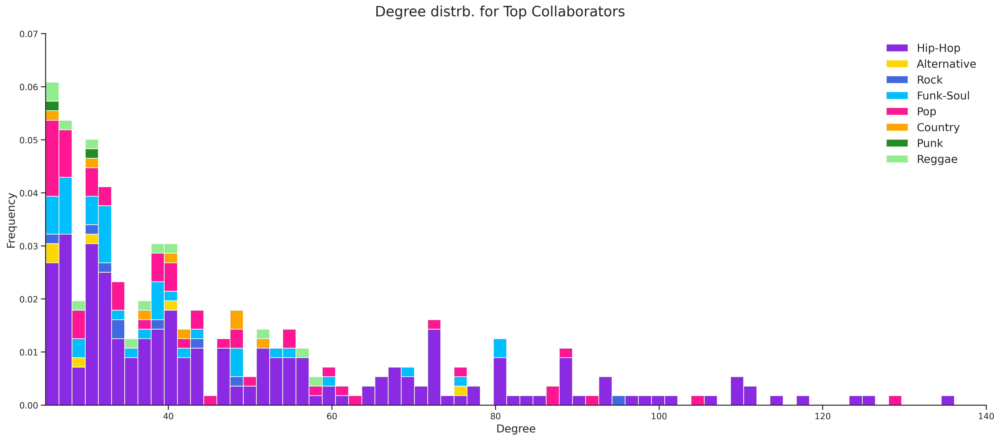

In [ ]:
# Degree distrb. for Top Collaborators
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(18, 8))
fig.suptitle("Degree distrb. for Top Collaborators", fontsize=18)

colors = list(color_state_nd.values())

with sns.axes_style("white"): 

    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})    
    sns.set_palette("bright")

    plt.hist(top_stack_gc , bins=100, stacked=True, density=True, color=colors)

    axes.set_xlim((25, 140))
    axes.set_ylim((0, 0.07))
            
    axes.set_xlabel("Degree", size= 14)
    axes.set_ylabel("Frequency", size = 14)
    sns.despine()
    
    axes.legend(frameon=False,loc='upper right',  ncol=1,
     labels = ('Hip-Hop', 'Alternative', 'Rock', 'Funk-Soul','Pop', 'Country', 'Punk', 'Reggae'),  prop={'size': 14})

fig.tight_layout()
plt.show()

By zooming in on the top collaborators, it is possible to confirm the important presence of *Hip-Hop* in the top tier.
For degrees higher than 60, the other genres only appear sporadically. Perhaps, *Pop* could be considered in second place
but its representation is still minimal.

However, the histogram does not take into account the unbalanced amount of artists within each genre. 

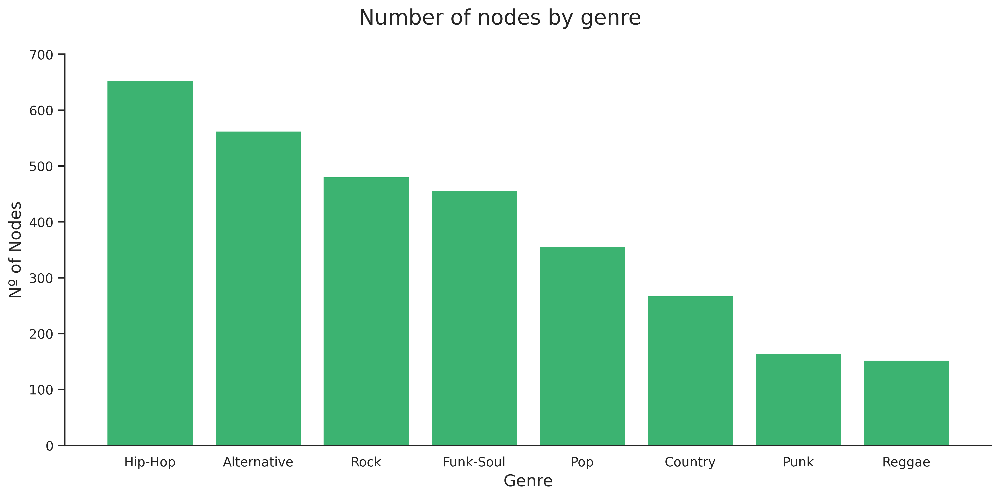

In [ ]:
# Displaying the genres unbalanced sizes

N_gen = [len(dic_GenDeg[gen]) for gen in sort_gen]

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
fig.suptitle("Number of nodes by genre", fontsize=18)

plt.bar(sort_gen, N_gen, color="mediumseagreen")

axes.xaxis.set_ticks_position('none') 
axes.set_ylim((0, 700))
            
axes.set_xlabel("Genre", size= 14)
axes.set_ylabel("Nº of Nodes", size = 14)
sns.despine()
fig.tight_layout()
plt.show()

For instance, *Hip-Hop* has almost twice the amount of nodes compared to *Pop* (654 against 353 nodes).
 We, therefore, need to validate the distribution while taking in to account the number of nodes.

The ratio of top collaborators against other artist is thus plotted by each genre.

In [ ]:
# Calculating the ratios of Top Collaborators by Genre
ln_top = [len(gendeg) for gendeg in top_stack_gc]
ln_low = [len(gendeg) for gendeg in res_stack_gc]

rat_top=[]
rat_low=[]
for elem in zip(ln_top,ln_low):
    tot_i = sum(elem)
    rat_top.append(100*elem[0]/tot_i)
    rat_low.append(100*elem[1]/tot_i)

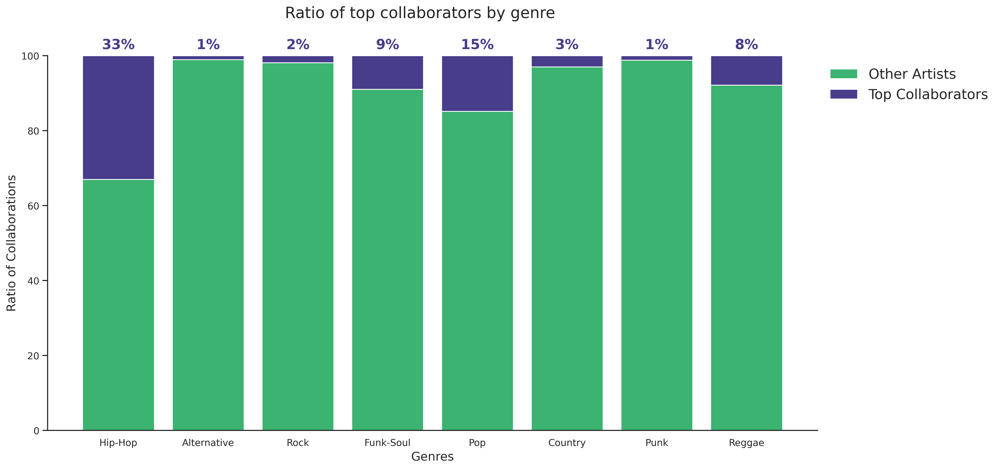

In [ ]:
# Degree distrb. for Top Collaborators
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16, 8))
fig.suptitle("Ratio of top collaborators by genre", fontsize=18)

colors = list(color_state_nd.values())

plt.bar(sort_gen, rat_low, color="mediumseagreen")
plt.bar(sort_gen, rat_top, bottom =rat_low, color = "darkslateblue")

axes.xaxis.set_ticks_position('none') 
axes.set_ylim((0, 100))
            
axes.set_xlabel("Genres", size= 14)
axes.set_ylabel("Ratio of Collaborations", size = 14)
sns.despine()
    
axes.legend(loc="upper left", labels = ('Other Artists', 'Top Collaborators'),  prop={'size': 16}, 
            frameon=False, bbox_to_anchor=(1, 1))

rects = axes.patches
for rect, label in zip(rects, rat_top):
    height = rect.get_height()
    axes.text(rect.get_x() + rect.get_width() / 2, 101, str(round(label))+"%",
                    ha='center', va='bottom', color="darkslateblue", fontweight ="bold", fontsize =16)

# fig.tight_layout()
plt.show()

When looking at the ratio of top collaborators within each genre, it is possible to see that *Hip-Hop* holds still the highest ratio,
 with one-third of its nodes being top collaborators. 
 *Pop* follows *Hip-Hop* but with a relatively lower ratio of top collaborators within its nodes at 15%. 
 *Reggae and Funk-Soul*, are not far from *Pop*, with 9% and 8% respectively.
 However, *Country, Rock, Alternative and Punk* all share a substantially low ratio of top-collaborators, all below 4%.

Thus when looking at the high degree low-frequency nodes, from the *power-law* distribution, we can conclude
 that based on our dataset the genre with the most presence is *Hip-Hop*. 
 The artist with the highest number of collaborations will thus tend to be *Hip-Hop* artists.

Nevertheless, it is interesting to compare the distribution of all the collaborations for each genre. 
Applying a boxplot visualization will allow us to get a general idea on the basic statistics of each genre. 
Although when analyzing the results we will need to keep in mind the unbalance between genre nodes.
Additionally, a logarithmic scale will be applied to be able to display the results more clearly.

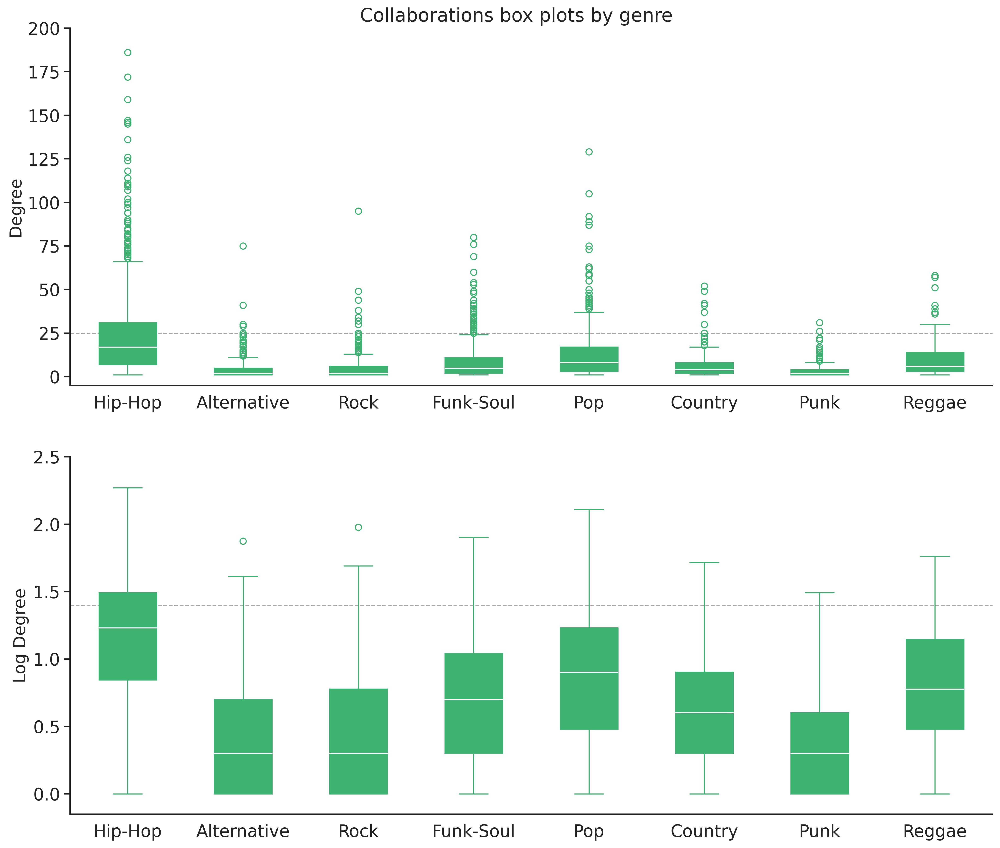

In [ ]:
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(16,14))

fig.suptitle("Collaborations box plots by genre", fontsize=18, y=0.9)
with sns.axes_style("white"):
    
    plt.rcParams['figure.dpi'] = 360
    sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})
    sns.set_palette("pastel")

    ax1.plot([0.5,8.5],[25, 25], color='darkgrey', linestyle='--', linewidth=1)

    c= "mediumseagreen"
    ax1.boxplot(all_stack_GenDeg, patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color="white"),
            )

    

    ax1.set_xticklabels(sort_gen)
    ax1.set_ylim((-5, 200))
    ax1.set_ylabel("Degree", size=16)
    ax1.xaxis.set_ticks_position('none')

    log_stack = [np.log10(lt) for lt in all_stack_GenDeg]
    
    ax2.plot([0.5,8.5],[np.log10(25), np.log10(25)], color='darkgrey', linestyle='--', linewidth=1)
    ax2.boxplot(log_stack, patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color="white"),
            )

    ax2.set_xticklabels(sort_gen)
    ax2.set_ylim((-0.15, 2.5))
    ax2.set_ylabel("Log Degree", size=16)
    ax2.xaxis.set_ticks_position('none')

    sns.despine()

plt.show()

With these visualizations we aim to identify what is the general collaboration tendency, and how the whole set of nodes (not only the high degree),
behave for each genre.

 By looking at the boxplot in a logarithmic scale, it allows us to clearly visualize the comparisons between ranges. 
 A drawback of the logarithm is that we lose visibility of the outliers, therefore we keep the original scale to comment on them. 
 Additionally, the barrier between the top collaborations and the other artists is added as a grey dashed line.

As previously suggested, the interquartile-range for *Hip-Hop* artists is the one that reaches the highest level of collaborations as it reaches a degree of 30.
It is thus the only genre with an interquartile-range exceeding the frontier of top collaborators.
 When looking at the logarithm scale, we can see that the median is also significantly higher than for the other genres.
 
The third quantile of the genre *Pop* is the highest one after *Hip-Hop*, however, *Reggae* reaches to almost the same value. 
And generally look similar to *Pop* in the logarithmic boxplots, something we were not able to identify from the histograms. 
In fact, if we look at the original scale and analyse the outliers, these three genres are the only ones
where not all the values that exceed a degree of 25 are outliers. 

It is as well interesting to see that the lowest medians and ranges are for the genres *Alternative*, *Rock* and *Punk*. 
Which indicates that indeed these genres will tend to have a lower number of collaborations.


As an extension to the question of whether or not the level of collaboration and genre are intertwined it is further interesting
 to analyse if collaborations happen within the same genre or between genres?


In [ ]:
# Defining one function to obtain the edges which go from the studied genre (main genre) to others
def genre_connection(main_gen, N_G, G):
    MAIN_nod = [nod for nod,gen in N_G if gen == main_gen]
    to_out = 0
    to_main = 0
    conn = []

    for edge in G.edges():
        if (edge[0] in MAIN_nod) & (edge[1] not in MAIN_nod):
           conn.append(edge)
           to_out += 1

        elif (edge[0] not in MAIN_nod) & (edge[1] in MAIN_nod):
           conn.append(edge)
           to_out += 1
        
        elif (edge[0] in MAIN_nod) & (edge[1] in MAIN_nod):
            to_main += 1

    return(to_main, to_out, conn)

In [ ]:
# Defining one function to validate if the edges that go outside, match with certain genre (review genre)
def getratio_revgen(rev_gen, DICT):
    REV_rat = []
    for main,val in DICT.items():
        for elem in val.items():
            if elem[0]==rev_gen:
                REV_rat.append(elem[1])
    return(REV_rat)

In [ ]:
# Iterating through all the genres to study their edges and obtain the ratios between genres
gen_it = sorted(sort_gen.copy())
GEN_RAT = {}

for main_gen in gen_it:
    
    y1,y2,out_conn = genre_connection(main_gen, nod_genre, G_AC)
    tot = y1+y2
  
    gen_rev = sort_gen.copy()
    gen_rev.remove(main_gen)

    GEN_RATREV = {}
    GEN_RATREV[main_gen] = 100*y1/ tot

    for gen in gen_rev:
        REV_nod = [nod for nod,g in nod_genre if g == gen]
        to_grev = 0
        for edge in out_conn:
            if (edge[0] in REV_nod) or (edge[1] in REV_nod):
                to_grev += 1

        GEN_RATREV[gen] = 100*to_grev/tot
    
    od_GEN_RATREV = collections.OrderedDict(sorted(GEN_RATREV.items()))
    
    GEN_RAT[main_gen] = od_GEN_RATREV

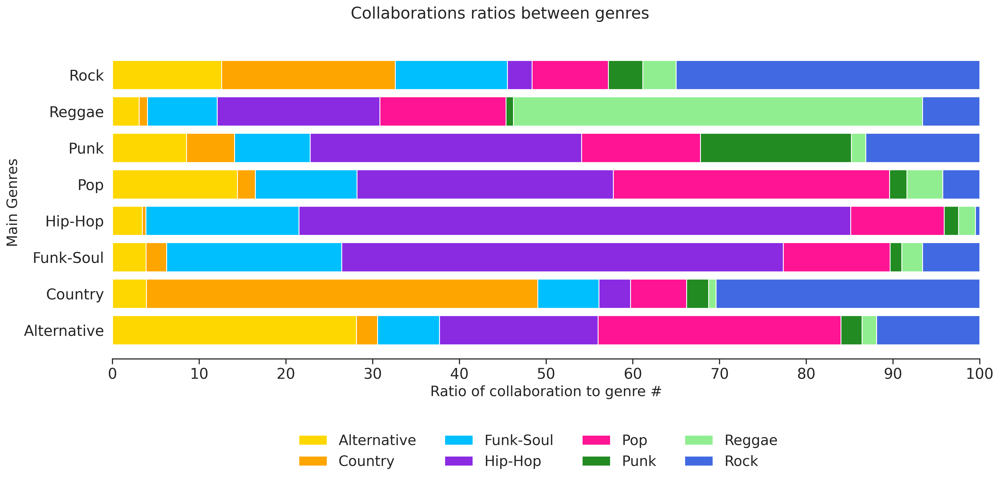

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16, 8))
fig.suptitle("Collaborations ratios between genres", fontsize=18)
   
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})    
plt.rcParams['figure.dpi'] = 600

y00 = getratio_revgen(gen_it[0], GEN_RAT)
plt.barh(gen_it, y00, color=color_state_nd[gen_it[0]])
y_past = [0, 0, 0, 0, 0, 0, 0, 0]

for i in range(1,len(gen_it)):
    yi_1 = getratio_revgen(gen_it[i-1], GEN_RAT)
    yii = getratio_revgen(gen_it[i], GEN_RAT)

    y_past = [i+j for i,j in zip(y_past, yi_1)]

    plt.barh(gen_it, yii, left = y_past, color = color_state_nd[gen_it[i]])


axes.set_xlim((0, 100))
axes.set_xticks(np.arange(0, 101, step=10))
axes.yaxis.set_ticks_position('none') 
    
axes.set_ylabel("Main Genres", size= 16)
axes.set_xlabel("Ratio of collaboration to genre #", size = 16)
sns.despine(left=True)
    
axes.legend(loc="upper left", bbox_to_anchor=(0.2, -0.2), ncol =4,
 labels = gen_it,  prop={'size': 16}, frameon=False)
    

fig.tight_layout()
plt.show()

In [ ]:
for main_gen, ratios in GEN_RAT.items():
    for elem in ratios.items():
        if main_gen == elem[0]:
            print(f"{main_gen} | Within ratio: {round(elem[1])}%")

Alternative | Within ratio: 28%
Country | Within ratio: 45%
Funk-Soul | Within ratio: 20%
Hip-Hop | Within ratio: 64%
Pop | Within ratio: 32%
Punk | Within ratio: 17%
Reggae | Within ratio: 47%
Rock | Within ratio: 35%


First of all, the visualization, shows that *Hip-Hop* and *Reggae*, are the ones with the higher ratio of edges within the same genre; 64% and 47% respectively.
 These two where among the genres that reached to the highest degree, together with *Pop*. Thus this could indicate that to reach
 a higher number of collaborations it is important to have strong proximity with artists from the same genre.
 However, *Pop* has a relatively low ratio of collaborations within and *Country* reaches as well a high within ratio of 45%, almost the same as *Reggae*
 which could indicate the opposite. 

<!-- 
The visualization, first of all, shows how the genres that reached to the highest degree, *Hip-Hop* and *Reggae*, are the ones with the higher ratio of edges within the same genre; 64% and 47% respectively. This could indicate that to reach
 a higher number of collaborations it is important to have strong proximity with artists from the same genre.
 However, *Country* as well reaches a high within ratio of 45%, almost the same as *Reggae*.  -->

The rest of genres within ratios falls in a lower range, between 35% for *Rock* to the lowest *17%* for *Punk*.

The stacked bar chart also allows us to see how much each genre collaborates with the other genres. 
 By analysing the plot the following observations are made:
 
- As previously observed, for *Hip-Hop*, *Reggae* and *Country* the collaborations towards other genres are the smallest. However, *Hip Hop* will collaborate as well with *Funk-Soul*, *Reggae* with *Hip Hop* and *Pop*, and *Country* mainly with *Rock*.
- *Pop* artists collaborate a lot with *Hip-Hop*, in fact as much as they collaborate with artist from their genre.
- Surprisingly, *Punk* artist collaborate a lot with *Hip-Hop* artists,
 more than 30% of its collaborations were with *Hip-*Hop* artists.
- Similarly, the biggest collaborator for *Funk-Soul* is by far *Hip-Hop*, with 51% of its collaborations. However, 
this is expected due to its proximity and shared origins.
- *Rock* artist collaborate a lot with both artists from the *Alternative* and *Country genre. 
However, this is also expected due to the proximity of the genres.

We can thus conclude that first of all the level of collaboration does seem to depend on the genre type, and that artists within specifically *Hip-Hop* tend to collaborate more.
Furthermore, it seems that while all genres do collaborate with the level of collaboration between genres also greatly depends on the genre type.
The genres *Hip-Hop*, *Country* and *Reggae*, for example, collaborates a lot with artists within their genre while a genre like *Punk* collaborates just as much with several different genres.


However, we should take into consideration if the links between genres are related to their current popularity.
Since it could be that the most popular genres are the ones with the highest relation between each other.

To validate this, it is possible to check if there are genres significantly 
more popular than others:

In [ ]:
# Creating a dictionary with the popularity of each node by Genre:
GEN_POP = {i:[] for i in sort_gen}
for nod1, pop in nod_popularity:
    for nod2, gen in nod_genre:
        if nod1 == nod2:
            L = GEN_POP[gen].append(pop)

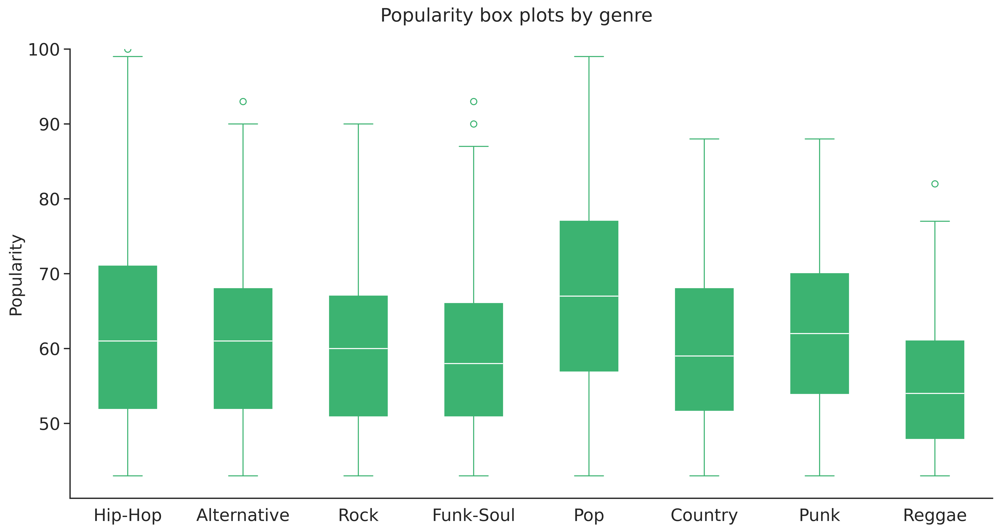

In [ ]:
fig, ax1 = plt.subplots(1, figsize=(16,8))
fig.suptitle("Popularity box plots by genre", fontsize=18, y=0.95)

plt.rcParams['figure.dpi'] = 360
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

c= "mediumseagreen"
ax1.boxplot(GEN_POP.values(), patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color="white"),
            )

ax1.set_xticklabels(GEN_POP.keys())
ax1.set_ylim((40, 100))
ax1.set_yticks(np.arange(50, 101, step=10))
ax1.xaxis.set_ticks_position('none')
ax1.set_ylabel("Popularity", size=16)
sns.despine()
plt.show()

By looking at the Popularity by genre, we can see that the most popular genre is *Pop*.
 But there is not a significant difference between the others. Therefore, 
 the high colaboration from example *Pop* to *Hip-Hop* artists, is not related to the popularity of the genres.

It is interesting to see as well which are the most popular artists by genre:

In [ ]:
GEN_POP_NOD = {i:[] for i in sort_gen}
for nod1, pop in nod_popularity:
    for nod2, gen in nod_genre:
        if nod1 == nod2:
            L = GEN_POP_NOD[gen].append((nod1,pop))

print("Top 5 most popular artists by Genre:")
for gen in GEN_POP_NOD.keys():
    print(gen)
    for elem in GEN_POP_NOD[gen][:5]:
        print(f"{G_AC._node[elem[0]]['name']} | Popularity Ratio: {elem[1]}")
    print()

Top 5 most popular artists by Genre:
Hip-Hop
Drake | Popularity Ratio: 100
Juice WRLD | Popularity Ratio: 99
Travis Scott | Popularity Ratio: 96
Post Malone | Popularity Ratio: 95
DaBaby | Popularity Ratio: 95

Alternative
Billie Eilish | Popularity Ratio: 93
Maroon 5 | Popularity Ratio: 90
Imagine Dragons | Popularity Ratio: 90
Doja Cat | Popularity Ratio: 89
Arctic Monkeys | Popularity Ratio: 87

Rock
Queen | Popularity Ratio: 90
The Beatles | Popularity Ratio: 89
Fleetwood Mac | Popularity Ratio: 88
Elton John | Popularity Ratio: 86
Metallica | Popularity Ratio: 86

Funk-Soul
Khalid | Popularity Ratio: 93
Joji | Popularity Ratio: 90
Frank Ocean | Popularity Ratio: 87
Adele | Popularity Ratio: 86
Michael Jackson | Popularity Ratio: 86

Pop
Ariana Grande | Popularity Ratio: 99
Justin Bieber | Popularity Ratio: 96
The Weeknd | Popularity Ratio: 96
Taylor Swift | Popularity Ratio: 95
Dua Lipa | Popularity Ratio: 94

Country
Luke Combs | Popularity Ratio: 88
Morgan Wallen | Popularity Ra

Our knowledge of different genres allows us to recognize some of the artists.
 It is possible to see how the genres identified with the community partitions, 
 explained in previously, match our expectations in almost all cases.
 We can see that *Drake* and *Travis Scott* are in *Hip-Hop*, *Queen* and *The Beatles* in *Rock*,
 and *Arianna Grande* and *Justin Bieber* in Pop. It is exciting to see the success of our genre partitions exercise.
 

## 4.3 Collaborations vs. Sentiment
In this section the objective is to answer the questions: *Are the lyrics of the artist who collaborate sadder or happier than the rest?*

To evaluate this the sentiment of each artist is needed.
For every artist, the sentiment for each of the lyrics is calculated and the artist is assigned the average of the lyric sentiments.
However, the sentiment of each artist is only based on 3-5 song lyrics and can therefore change substantially if more or fewer songs were included.
In the notebook `data_preparation.ipynb` the work of calculating and storing the sentiment is done. 
To calculate the sentiment a list of words from [LabMT](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) is used which contains the sentiment score of words.
A low value indicates that the word is sad while a high value indicates that the word is considered happy.

Below the graph containing the sentiment is loaded.

In [5]:
# load graph with sentiments
G = nx.read_graphml("data/graphs/G_final_sentiment.graphml")

# Example of how the sentiment is stored:
G._node["3WrFJ7ztbogyGnTHbHJFl2"]

{'name': 'The Beatles',
 'popularity': 89,
 'genre': 'Rock',
 'sentiment': 5.568700849963045}

With the sentiment of every artist we initially want to see the distribution of the the sentiment.

In [6]:
# get the sentiment of every node
nod_sentiment = sorted([(nod, G._node[nod]['sentiment']) for nod in G.nodes()], key=lambda x: x[1], reverse=True)

sentiment = [sent for nod,sent in nod_sentiment]
degree = [G.degree[nod] for nod,sent in nod_sentiment] 

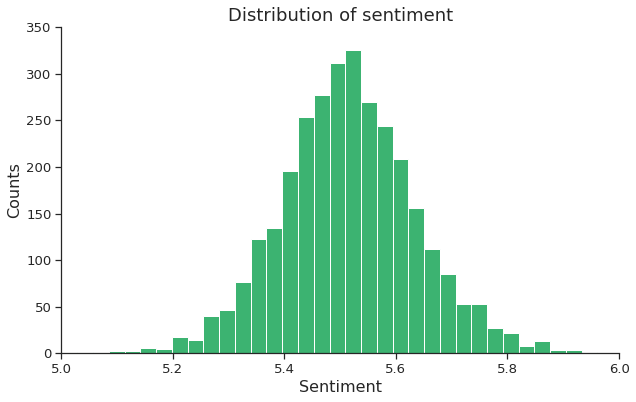

In [8]:
fig, ax = plt.subplots(1, figsize=(10,6))   
plt.rcParams['figure.dpi'] = 360
ax.hist(sentiment,bins=40, color = "mediumseagreen")
ax.set_xlabel("Sentiment", size= 16)
ax.set_ylabel("Counts", size = 16)
ax.set_title("Distribution of sentiment", size= 18)
ax.set_ylim(0,350)
ax.set_xlim(5,6)
sns.despine()
plt.show()

In [ ]:
# Using get_artist_genres function from %useful_functions
basic_stats(sentiment)

  N:  3098
  Variance 0.01
  Average: 5.51
  Median: 5.512774542451824
  Max: 6.102509200980014
  Min: 4.972694423376312


The plot shows that the sentiment is normally distributed, with an average of 5.51 and variance of 0.01.
The distribution is thus considerably different than the one for the popularity which was a skewed distribution.

To evaluate if the sentiment and collaborations are intertwined the correlation is plotted below.

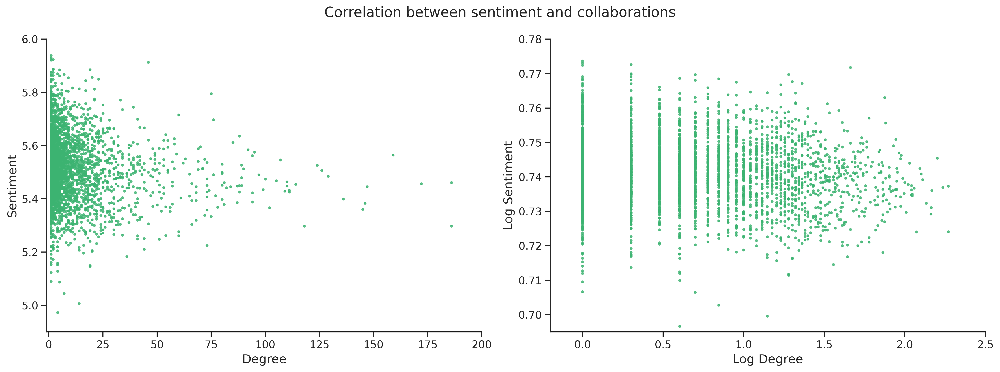

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation between sentiment and collaborations", size=16)

plt.rcParams['figure.dpi'] = 360

ax1.scatter(degree,sentiment,s=5, alpha=0.8, color = "mediumseagreen")
    
ax1.tick_params(axis = "both",labelsize = 12 )
ax1.set_ylabel("Sentiment", size=14)
ax1.set_xlabel("Degree", size=14)

ax1.set_xlim(-1,200)
ax1.set_ylim(4.9,6)

ax2.scatter(np.log10(degree),np.log10(sentiment), s=5, alpha=0.8, color = "mediumseagreen")
    
ax2.tick_params(axis = "both",labelsize = 12 )
ax2.set_ylabel("Log Sentiment", size=14)
ax2.set_xlabel("Log Degree", size=14)

ax2.set_xlim(-0.2,2.5)
ax2.set_ylim(0.695,0.78)

sns.despine()
fig.tight_layout()
plt.show()

In [ ]:
print("Correlation Matrix: Sentiment vs Degree")
print(np.corrcoef(sentiment, degree))

Correlation Matrix: Sentiment vs Degree
[[ 1.         -0.12565376]
 [-0.12565376  1.        ]]


The plot and the correlation value shows that there is little to no correlation between the sentiment and collaborations, with a correlation degree very close to 0.
It can however be observed that if an artist has a very low degree the sentiment of the songs can wary but as the degree increases the sentiment becomes more and more centred around the average sentiment.

To further analyse the relationship between the sentiment and collaborations a box plot for the top collaborators and the other artists are also constructed.

In [10]:
top_collab_sent = [sent for nod,sent in nod_sentiment if G.degree[nod] >= 25]
rst_collab_sent = [sent for nod,sent in nod_sentiment if G.degree[nod] < 25]

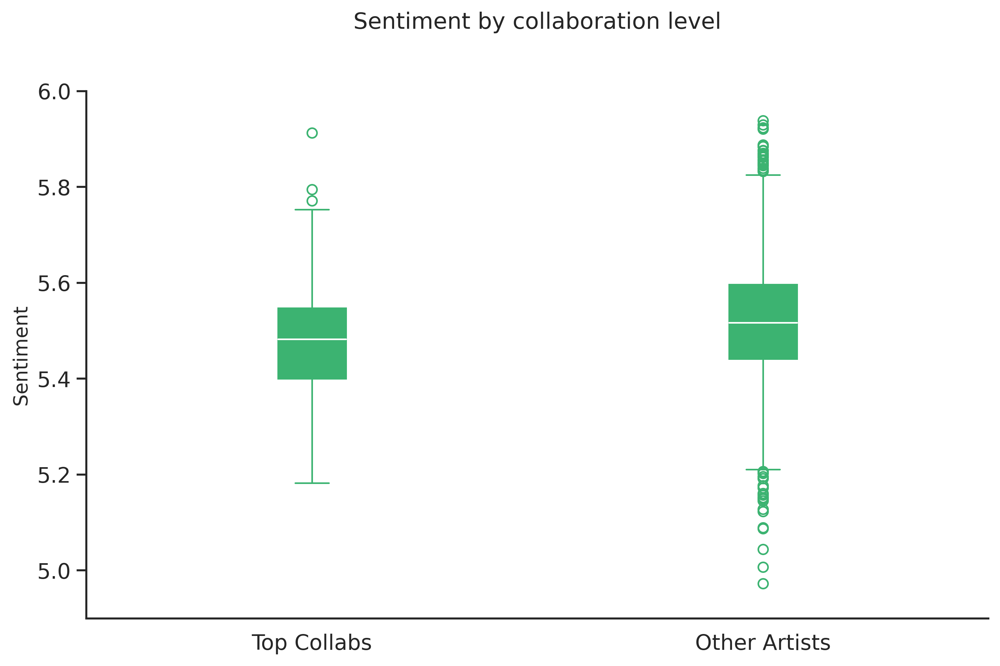

In [12]:
fig, ax1 = plt.subplots(1, figsize=(10,6))

plt.rcParams['figure.dpi'] = 360
    
c= "mediumseagreen"
ax1.boxplot([top_collab_sent, rst_collab_sent], patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color="white"),
            )

ax1.set_xticklabels(["Top Collabs", "Other Artists"])    
ax1.xaxis.set_ticks_position('none')   

ax1.set_ylim(4.9,6)
ax1.set_ylabel("Sentiment", size=12)
ax1.set_title("Sentiment by collaboration level", size=14, y=1.1)

sns.despine()
plt.show()


In [ ]:
print("TOP COLLABORATORS")
basic_stats(top_collab_sent)
print("\n""OTHER ARTISTS")
basic_stats(rst_collab_sent)

TOP COLLABORATORS
  N:  347
  Variance 0.01
  Average: 5.48
  Median: 5.482327519022933
  Max: 5.912771997692271
  Min: 5.18251830479169

OTHER ARTISTS
  N:  2751
  Variance 0.02
  Average: 5.52
  Median: 5.516812342459832
  Max: 6.102509200980014
  Min: 4.972694423376312


The Box plot shows a slight difference between top collaborators concerning the average and min and max values.
But as the difference is minimal which together with the correlation plot strongly indicates that the sentiment of the lyrics of an artist is not related to how much an artist collaborate.
This analysis is however only based on 3-5 lyrics for each artist. 
If more lyrics were included different moods of each genre might be captured and the results could thus change significantly.

## 4.4 Collaborations vs Time
In this section the objective is to look into the question of *Has the amount of collaborations changes through the history of time?*

To do this we first of all need to retrieve the release date of every song lyrics that we have downloaded.
The dataframe `df_song_info`, which is created in the notebook `data_preparation.ipynb`, is loaded and contains information about every song.

In [32]:
## Read dataframe:
df_song_info = pd.read_pickle("data/other_files/df_song_info.pkl")
df_song_info['year'] = df_song_info['year'].astype(int) # convert year column to integer values
df_song_info.head()

,song_id,artist,artist_id,genre,sentiment,year
0,5HQEmiV2lKnSO6qa2fsR7x,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.367130,1975
1,1LOZMYF5s8qhW7Rv4w2gun,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.734272,1978
2,6KEWtSOGKpIXGw6l1uJgsR,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.650507,1977
3,1QQgSUKCG8GakzMOwi4lFS,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.270608,1973
4,4E2gdBRKC12MJWFUOkH0UN,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.734272,2002


With the data we first of all need to understand how the songs and genres have develop over time.

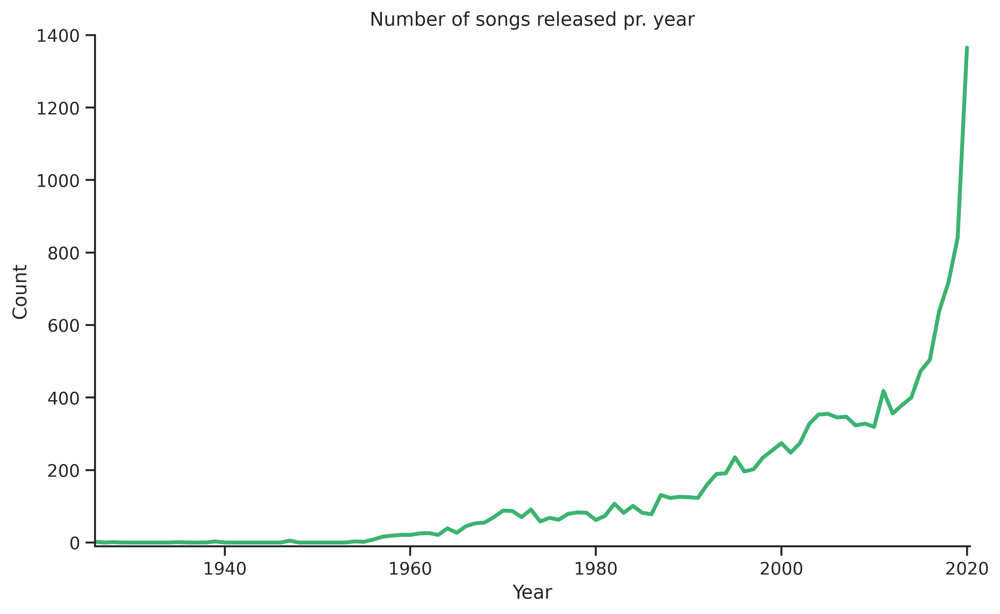

In [33]:
# Define unique years
years = np.arange(int(min(df_song_info.year.unique())),int(max(df_song_info.year.unique()))+1,step=1)

song_cnt = [] # vector for song counts

for year in years:
    temp = df_song_info[df_song_info['year'] == year]
    song_cnt.append(temp.shape[0])

# Plotting
fig = plt.figure(figsize=(10,6))
plt.plot(years,song_cnt, color='mediumseagreen')
plt.xlabel("Year")
plt.ylabel("Count")
plt.xlim(min(years),max(years)+0.3)
plt.ylim(-10,round(max(song_cnt),-2))
plt.title("Number of songs released pr. year")
sns.despine()
plt.show()

The graph resembles an exponential function. 
Before the 1960's not many songs are released. 
However, after this point more and more songs are released and as we get closer to 2020 the amount of songs increases exponentially.

As the popularity and emergence of genres change throughout the time it is interesting to see how the distribution between the genres have changed throughout time for our subset of artists and songs.
To visualize this an area plot of the songs over time is constructed. 
For every year the amount of songs released within each genre is calculated.
This is then divided by the total number of songs released that year to normalize the data.

For the following visualizations, no data which is from before 1960 is included as very few songs (and artists) are from before this point.
Including them in the analysis creates more confusing plots due to missing data for several years. 

In [34]:
## Set up the dataframe
df_area_plot = pd.DataFrame(columns = np.append(df_song_info.genre.unique(),'Year'))
df_area_plot.Year = years
df_area_plot = df_area_plot.set_index('Year')

# Loop over all years
for year in years:
    temp = df_song_info[df_song_info['year'] == year] # retrieve dataframe for a single year
    genre_counts = temp.genre.value_counts() # get the genre counts for the year

    for genre in genre_counts.keys():
        df_area_plot.loc[year][genre] = genre_counts[genre]/sum(genre_counts)

## Fill 0 instead of 'na'
df_area_plot = df_area_plot.fillna(0)

df_area_plot.tail()

,Rock,Pop,Hip-Hop,Country,Punk,Alternative,Funk-Soul,Reggae
Year,,,,,,,,
2016,0.063492,0.144841,0.248016,0.111111,0.029762,0.261905,0.113095,0.027778
2017,0.072100,0.152038,0.258621,0.106583,0.047022,0.235110,0.092476,0.036050
2018,0.043236,0.158996,0.304045,0.128312,0.061367,0.213389,0.069735,0.020921
2019,0.024970,0.202140,0.269917,0.118906,0.041617,0.234245,0.074911,0.033294
2020,0.035165,0.187546,0.292308,0.117216,0.045421,0.200000,0.090110,0.032234


In [ ]:
## Get colours
#Dictionary of colours with HEX code
color_state_nd2 = {"Rock":"#4668e0", "Hip-Hop":"#892be5", 
                  "Pop":"#fb1992","Alternative":"#ffd407",
                  "Country":"#ffa600", "Funk-Soul":"#00c3fb",
                  "Punk":"#1e8e1e","Reggae":"#90ec8e"}
# Get the right order of colours for plot
colors = []
genre_order = ['Rock','Pop','Hip-Hop','Country','Punk','Alternative','Funk-Soul','Reggae']
for genre in genre_order:
    colors.append(color_state_nd2[genre])

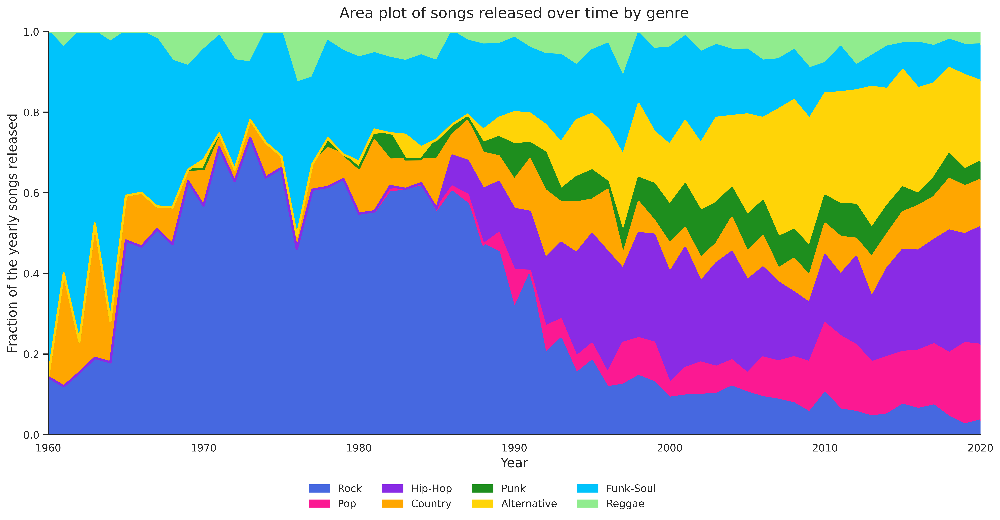

In [59]:
## Area plot of songs
plt.rcParams['figure.dpi'] = 600
ax = df_area_plot.loc[1960:].plot.area(figsize=(18,8),color=colors) 
ax.set_title("Area plot of songs released over time by genre", size=16, y=1.02)
ax.set_ylabel("Fraction of the yearly songs released", size=14)
ax.set_xlabel("Year", size=14)
ax.xaxis.set_ticks_position('none') 
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(0.27,-0.1), ncol =4)
# ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1), ncol =1)
ax.set_xlim((1960,2020))
ax.set_ylim((0,1))
sns.despine()
plt.show()

The area plot illustrates how different genres have evolved throughout time for our subset of artists and songs.
In the 1960s most of the songs released are from the genre *Funk-Soul* while from 1970 to 1990 *Rock* is the dominant genre.
After 1990 *Pop*, *Hip-Hop* and *Alternative* becomes the dominant genres.

This also makes a lot of sense when thinking about the history of music.
The genre *Funk-Soul* predominantly was big many years ago where after rock took over and became the king of music.
However, nowadays when you turn on the radio most music will come from the genres *Pop*, *Alternative* and *Hip-Hop*.

Finally, we can now visualize how the average yearly collaboration has developed throughout time.
By taking the yearly average the increasing number of songs is taken into account.
The visualization is done at an artist level and not song level.
The dataframe `df_artist_info`, which is also constructed in the notebook `data_preparation.ipynb`, is loaded as it contains all information about every artist.

In [ ]:
## Read dataframe:
df_artist_info = pd.read_pickle("data/other_files/df_artist_info.pkl")
df_artist_info['year'] = df_artist_info['year'].astype(int) # convert year column to integer values
df_artist_info.head()

,artist,artist_id,genre,sentiment,year,degree
0,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.551358,1981,2
1,Paul McCartney,4STHEaNw4mPZ2tzheohgXB,Rock,5.711872,1986,21
2,Rakim,3PyWEKLWI0vHPmoNrIX0QE,Hip-Hop,5.373357,2002,20
3,12th Planet,3V1h3kAdiVDBiwlY2i6dJz,Pop,5.593255,2017,6
4,Skrillex,5he5w2lnU9x7JFhnwcekXX,Pop,5.371399,2014,48


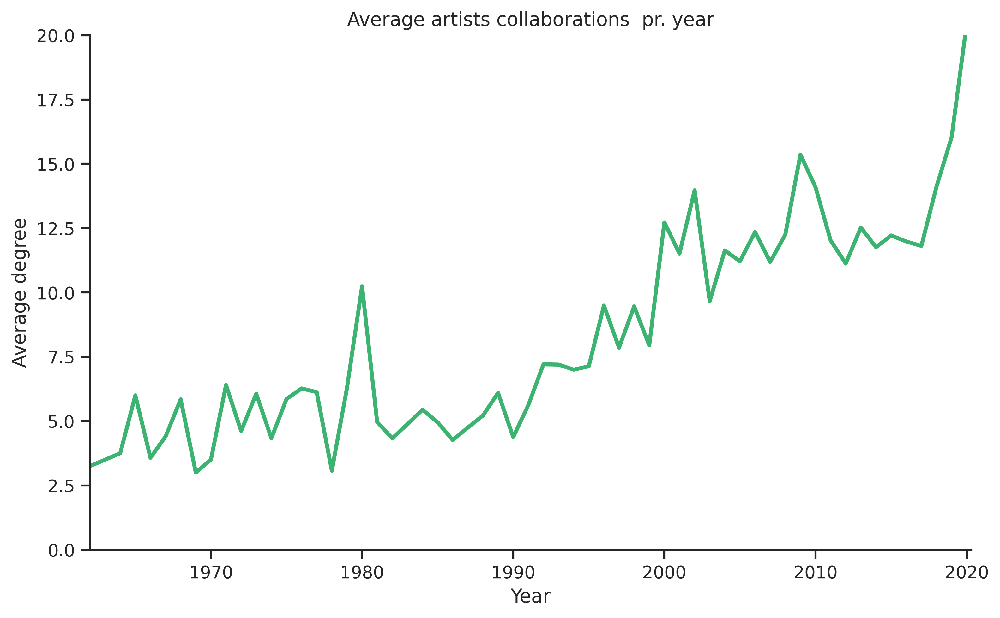

In [ ]:
# Define unique years
years = np.arange(1960,int(max(df_artist_info.year.unique()))+1,step=1)

avg_collab = []

for year in years:
    temp = df_artist_info[df_artist_info['year'] == year]
    avg_collab.append(np.mean(temp.degree))

# Plotting
fig = plt.figure(figsize=(10,6))
plt.plot(years,avg_collab, color='mediumseagreen')
plt.xlabel("Year")
plt.ylabel("Average degree")
plt.xlim(1960+2,max(years)+0.3)
plt.ylim(0,round(max(avg_collab),-1))
plt.title("Average artists collaborations  pr. year")
sns.despine()
plt.show()

The graph shows that from 1960 to 2020 the average degree increases from just above 2.5 to almost 20.
The graph thus strongly indicates that the time and amount of collaborations are dependent on each other.

One reason for the rise in collaboration could come from the evolution of the music or technology which has made it easier for an artist to collaborate and to reach an audience.
However, it could also be due to the development of genres such as *Hip-Hop* which was found to generally have a higher level of collaborators.


## 4.5 Collaborations analysis conclusion
After running the collaboration analysis we can assess how the factors studied influence artist collaborations. 

When it comes to ***Popularity***, the artists with a popularity ratio higher than 70% will most likely be among the top collaborators. 
  However, the correlation between the two is weak, thus the number of collaborations
  does not rely directly on the popularity of the artists. 

The ***Genres*** analysis allowed us to understand that the highest levels of collaboration are for the
   *Hip-Hop* artists. While the lowest level of collaborations was generally found among the genres *Alternative*, *Rock* and *Punk*.
   *Hip-Hop* is furthermore the genre with the highest ratio of collaborations within itself. 
   Meaning that the *Hip-Hop* artists collaborate more together than with artists from other genres. 
   This situation is similar for both *Reggae* and *Country*.
   When looking at the collaborations that between genres, it was found that 
   genres with similar characteristics or origins would tend to collaborate more them. 
   This is the case for *Funk-Soul* and *Hip-Hop* artists as well as 
   for *Rock*, *Alternative* and *Country* artists.

With regards to ***Time*** the analysis showed that indeed the level of collaboration of an artist depends on the time of the artist. 
From 1960 to 2020 the average number of collaborations of an artist went from 2.5 to 20 equivalent to 8 times as many collaborations. 
This increase in collaborations was however probably due to the increase of *Hip-Hop* artists over time which as mentioned generally has the highest levels of collaborations.

The ***Sentiment*** analysis did not show clear results, with a low correlation ratio and no clear difference between the top collaborators and the rets of artists.
 However, there are still interesting elements that the song lyrics and sentiment lyrics can show us. 
 Therefore, further analysis is conducted on the next page.

# 5. Text analysis
With the question of how artist collaborates answered, we now want to extend our analysis by analysing the texts further.
In this section, we will therefore analyse the song lyrics downloaded from genius.
Recall that for each artist originally the top 5 songs (accordingly to Spotify USA) were downloaded.
However, as some songs were purely instrumental or less famous, and the lyrics, therefore, were unavailable on genius, several song lyrics were not downloaded.
To deal with this problem only the artists which had at least 3 song lyrics in English were kept in the network.
The work of preparing the data used for the analysis in this section can be found in `data_preparation.ipynb`.

## 5.1 Lyrics word clouds
To get a better idea of the words used within each genre word clouds are constructed for each genre.
The dictionary `genre_text_cleaned.json` is loaded.
It contains all the lyrics for every genre where the lyrics have been tokenized, lemmatized, lowercased and punctuations and other signs have been removed.

In [ ]:
## Load json file:
with open("data/other_files/genre_text_clean.json") as json_file:
    genre_text = json.load(json_file)

### Simple word count word clouds

One way to make word clouds is to do it by word count. 
This simply means that whatever words are most common for a genre will be showed.
However, to avoid word clouds full of words such as 'I' and 'me' stopwords are removed from the documents.
To filter the data for stopwords the list of stopwords from `nltk` is used.


In [ ]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


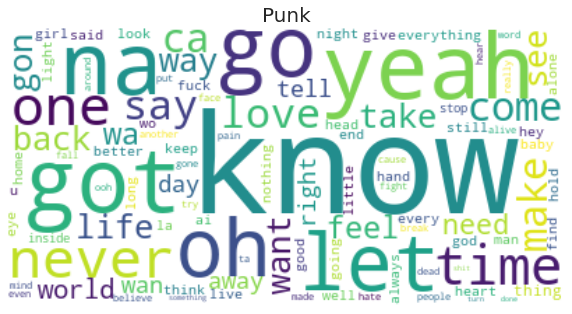

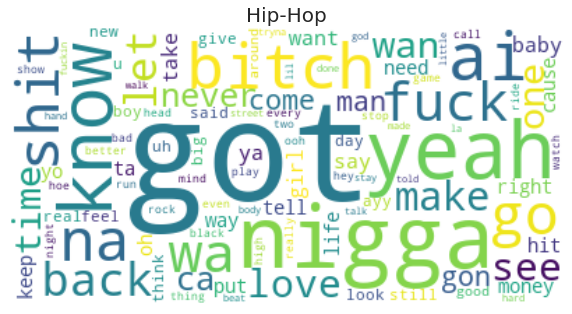

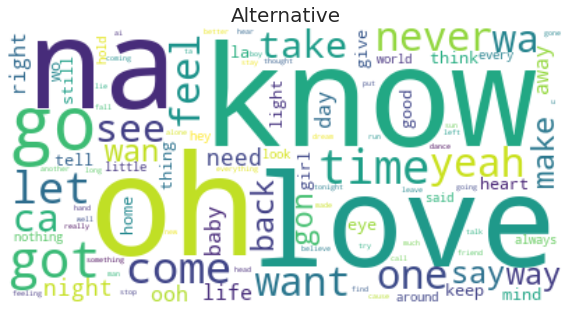

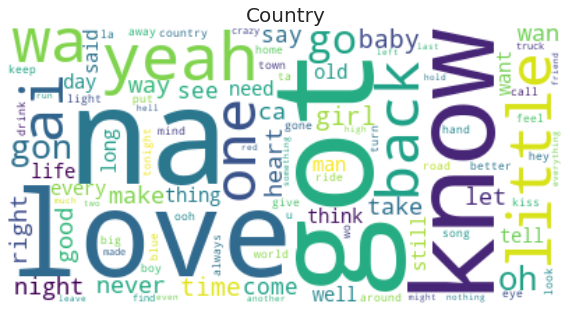

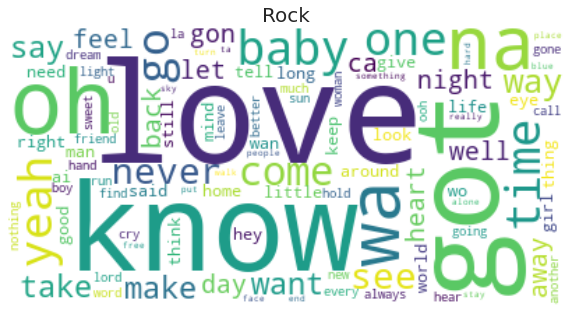

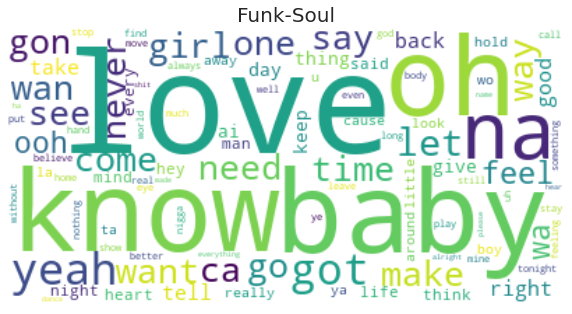

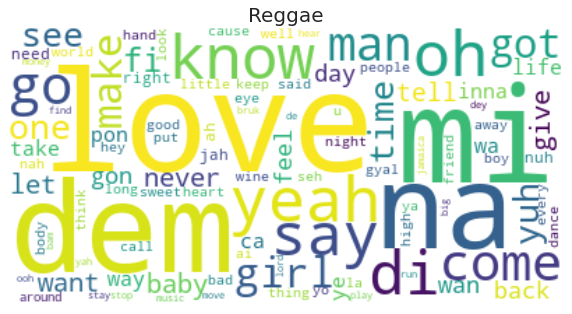

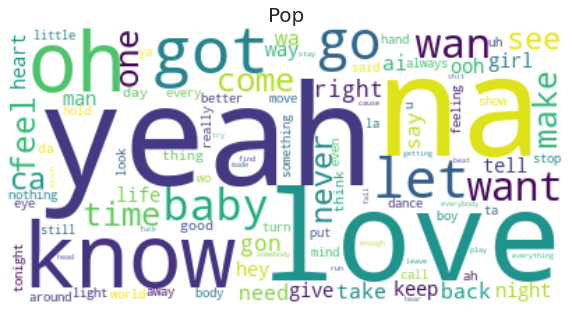

In [ ]:
for genre in genre_text.keys():
    TF = FreqDist(genre_text[genre]) # get the count of every word in the document
    
    # Remove stopwords
    TF_clean = {}
    for word in TF:
        if word not in stop_words:
            TF_clean[word] = (TF[word])
    
    # Replicate words accordingly to their value
    wc = ''
    for word in TF_clean:
        words = (word + ' ')*TF_clean[word]
        wc += words

    show_wordcloud(wc,genre,100)

From the word clouds, we see themes in some genres. 
Especially the genre *Hip-Hop* has some interesting words such as *bitch*, *nigga*, *shit* and *fuck* which are very unique for this genre.
Throughout the word clouds a lot of sound words, such as *oh*, can also be seen. 
These are not words that you would see in a word cloud for a normal text, but in song lyrics, it is a very common word.
As these word clouds are using the most common words in each genre a lot of the words such as *love* and *yeah* go again throughout all genres, and the word clouds can be hard to tell apart. 
To deal with this problem TF-IDF word clouds are also constructed.

### TF-IDF word clouds
TF-IDF (term frequency-inverse document frequency) is a method which is made to find the most important words within a single document in a corpus of documents.
For the TF the easiest way is to simply use the word counts. 
However, by doing this the length of the document is not taken into account.
For our case, it is important to take this into account as we preciously saw that the number of artists within each genre was unbalanced.
To illustrate this the length of text within each genre is shown.

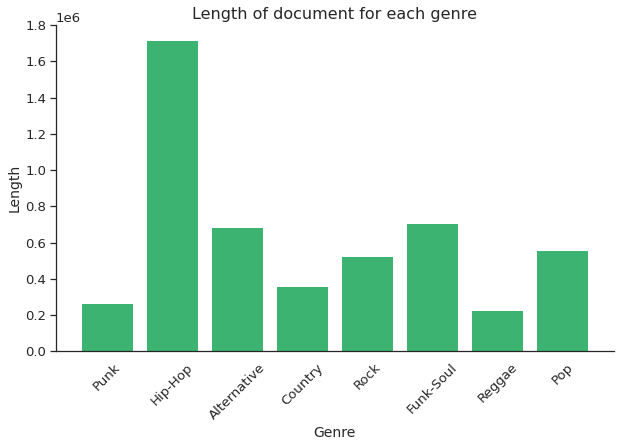

In [ ]:
# get length of document
genre_text_len = []
for genre in genre_text.keys():
    genre_text_len.append(len(genre_text[genre]))

# Plot
fig, ax = plt.subplots(1, figsize=(10,6))
sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})

ax.bar(genre_text.keys(),genre_text_len, color = "mediumseagreen")

ax.xaxis.set_ticks_position('none') 
plt.xticks(rotation=45)

ax.set_ylim((0, 1.8e6))

plt.title("Length of document for each genre", size=16)
plt.xlabel("Genre", size=14)
plt.ylabel("Length", size=14)

sns.despine()
plt.show()

The total length of the lyrics for each genre varies a lot. 
The big variation can be caused by different lengths of lyrics but is mostly due to the high imbalance of artist from each genre and thereby also the number of songs.

Therefore to calculate the TF the length of the document is also taken into account.

$$ 
\begin{aligned}
TF(t,d) = f_{t,d} / \sum_{t' \in d} f_{t',d}
\end{aligned}
$$

Where $t$ is the term and $d$ is the documents.
It is thus the times a word appears in a document divided by the sum of the frequency of the terms in the document.
To make the process faster stopwords are also removed, however, this is not strictly necessary as the TF-IDF will assign a low weight for the more common words.

In [ ]:
def get_TF(list_of_words):
    TF = FreqDist(list_of_words)
    
    # Get the stop words as a set
    stop_words = set(stopwords.words('english'))
    
    ## Remove the stopwords:
    TF_clean = {}
    for word in TF:
        if (word not in stop_words):
            TF_clean[word] = TF[word]/(len(list_of_words)) # Calculate TF
    
    return TF_clean

In [ ]:
# Get the TF for every genre
TF = {}

for genre in genre_text.keys():
    word_list = genre_text[genre] # Load documents for partition
    TF_word_list = get_TF(word_list) # Get the TF for all words
    TF[genre] = TF_word_list

The IDF on the other hand is concentrated about how much information a word has.
So if the word is commonly used across all documents, as we saw with the word *love*, or if the word is unique and only common for the one document.

$$
\begin{aligned}
IDF(t,D) = log(N/n_t)
\end{aligned}
$$

Where $N$ is the total number of documents in the corpus. 
$n_t$ is the number of documents in where the term appears, $n_t = |\{ d \in D : t \in d \}|$.
The IDF is thus not specific for every document but for every word in the corpus of documents.


In [ ]:
# Calculate the IDF of every word in the corpus
IDF_word = {}
genres = genre_text.keys()
for genre in genres:
    for word in TF[genre]: #Loop over all words within a genre/document
        i = 0 # Counts number of genres where the word occures
        for genre2 in genres: # Loop over all other genres
            if word in TF[genre2]: # Check for word in all documents
                i+=1 # Add one if word is found
        IDF = np.log(len(genres)/i) # Calculate the idf: log(N/n_t)
        IDF_word[word] = IDF

With the TF and IDF calculated the TF-IDF score for every word in every genre can then be calculated.
The TF-IDF is simply the product of the TF and IDF value.

In [ ]:
# Calculate TF_IDF for every word in every genre
TF_IDF = {}
for genre in genres:
    temp_dict = {}
    for word in TF[genre]: # Iterate over all words within a genre
        TF_IDF_temp = TF[genre][word]*IDF_word[word] # Calculate TF-IDF
        temp_dict[word]=TF_IDF_temp
    
    TF_IDF[genre] = temp_dict

Below the word clouds for the TF-IDF scores are illustrated.

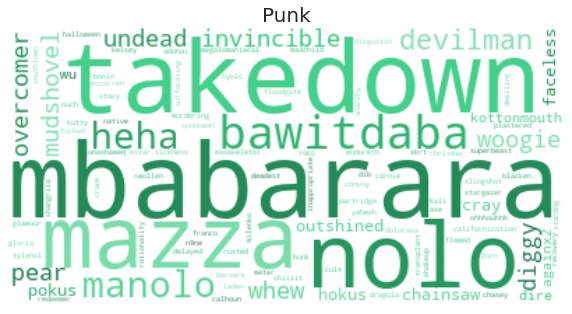

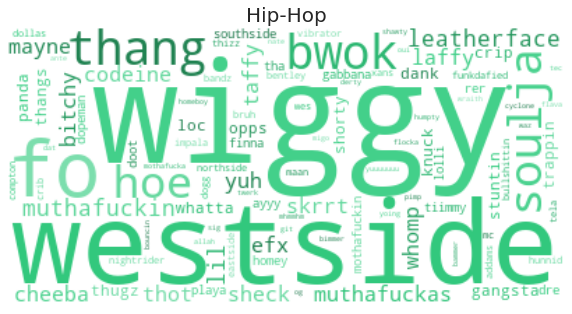

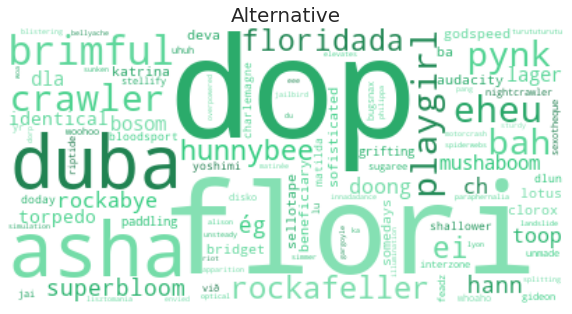

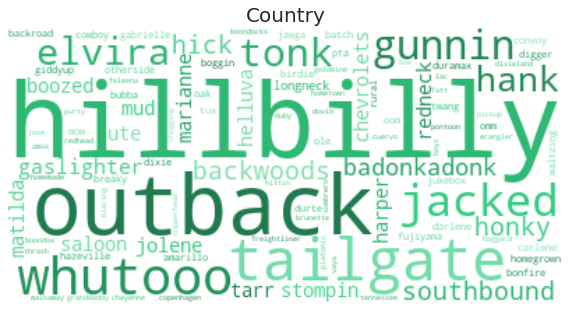

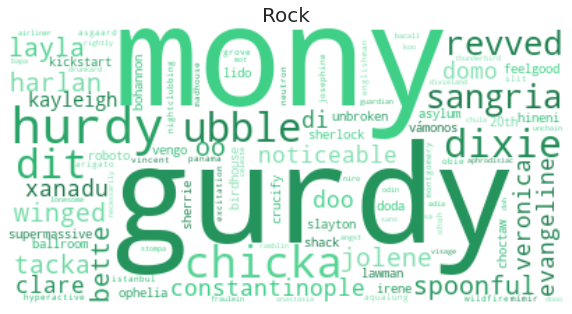

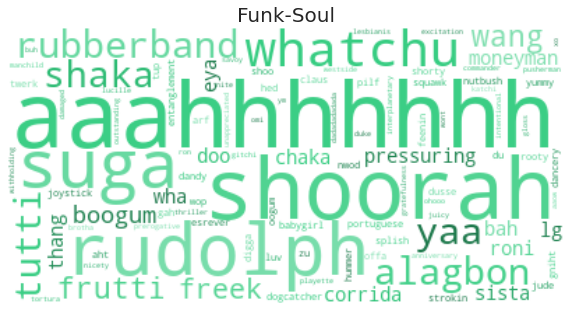

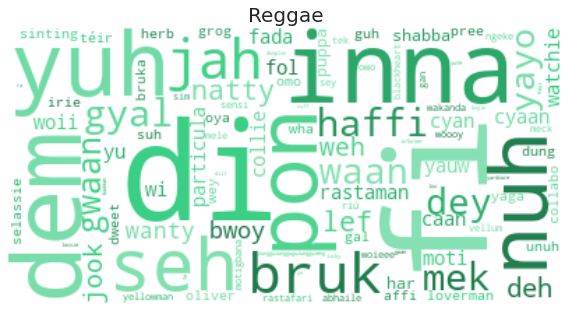

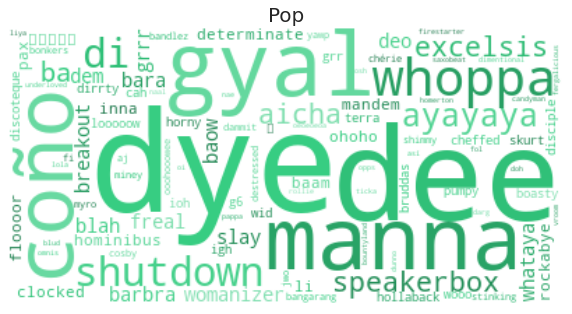

In [ ]:
# Print word clouds for all genres
for keys in TF_IDF.keys():
   show_wordcloud_TF_IDF(TF_IDF[keys],keys,100)

Comments for each word cloud are provided below. 

**Punk:** Many unusual words such as *mbabarara* and *bawitdaba* are showed in the word clouds.
These words might be word sounds but by searching the internet they do also appear in some songs as a part of the text. 
And the word *bawitdaba* is actually can actually be used as a neologism that emphasises the burden of choice.[[ ref ]](https://www.urbandictionary.com/define.php?term=Bawitdaba)
However, in general, it is hard to tell a specific theme from the word cloud.

**Hip-Hop:** From the word cloud alone it is rather clear that the genre is *Hip-Hop*.
The words *wiggy* (which is slang for 'emotional uncontrolled or weird'), *westside* (which could be a reference to the original west coast rap in America) and *thang* (slang for thing) are some of the most unique words for the genre. 
These words together with words such as *muthafuckin*, *bitchy* and *skrrt* all paint a rather clear picture of the *Hip-Hop* genre.

**Alternative:** The words in the word cloud do not paint a clear picture of the *Alternative* genre.
The words *dop*, *asha* and *flori* could, as in the *Punk* genre, be actual words but also some sort of sound words. 

**Country:** With words such as *outback*, *hillbilly* and *tailgate* a very clear theme is showed.
The words in the word clouds give you the *hillbilly* feeling of being on a farm, drinking beer out of your *chevrolets* and *gunnin*.
The word cloud thus confirms a lot of the classical stereotypical ideas about what *Country* music is.

**Rock:** The words in the word cloud does not paint the picture of rock.
By googling the word *mony* it can be seen that several artists have made songs with this as the title. 
The words *hurdy* and *gurdy* could reference to simply sounds or the stringed *Hurdy-gurdy* instrument.
Which again does not paint a clear picture of the classical idea about rock.

**Funk-Soul:** Several of the words, such as *alagbon* and *shoorah*, from a quick google search, are probably are very specific to few songs. 
However, there are some words that give of a more *Funk-Soul* vibe such as *suga*, *yaa* and the sound words *aaahhhhhhh* and *yaa*.

**Reggae:** Most of the words in the word cloud are nonsense words, slang or sound words such as *dem*, *di*, *fi* and *inna*.
This is however very typical for the *Reggae* genre as it is very inspired by Ska, which is an originally Jamaican music genre. 
Reggae therefore almost has its own terminology and sound words which are not used in other genres.
The word clouds thus paints a very good picture of some of the things reggae is all about.

**Pop:** The word cloud does not portray a very strong theme of *Pop*, which however also might be difficult.
It is very peculiar that the word *dye* is most unique as the action of dyeing (colouring) something does not strictly relate to pop.
Among the words are also a few foreign words such as *coño* (spanish slang for vulva) and *aicha* (Arabic female name), which indicates that some *Pop* artist is also inspired by other languages/cultures.

To summarize the results, the TF-IDF word clouds are more precise than the word clouds with simple wordcounts, and did a very good job at catching the theme for the genres *Hip-Hop*, *Country* and *Reggae*.
However, the question is if finding the TF-IDF score is the best way to catch the theme for all genres as it tries to find the unique words of the genre.
For some genres, the more general words might actually be the overall theme/feel of the genre.
Thich could explain why the word clouds for, for example, the genres *Pop* and *Rock* were less clear.

## 5.2 Lyrics sentiment

In this section, the sentiment is further analysed. 
To do this the dataframe `df_artist_info` is loaded which contains information about each artist.

In [ ]:
## Read dataframe:
df_artist_info = pd.read_pickle("data/other_files/df_artist_info.pkl")
df_artist_info.head()

,artist,artist_id,genre,sentiment,year,degree
0,10cc,6i6WlGzQtXtz7GcC5H5st5,Rock,5.551358,1981,2
1,Paul McCartney,4STHEaNw4mPZ2tzheohgXB,Rock,5.711872,1986,21
2,Rakim,3PyWEKLWI0vHPmoNrIX0QE,Hip-Hop,5.373357,2002,20
3,12th Planet,3V1h3kAdiVDBiwlY2i6dJz,Pop,5.593255,2017,6
4,Skrillex,5he5w2lnU9x7JFhnwcekXX,Pop,5.371399,2014,48


### Sentiment by genre
To begin with let's check the overall sentiment of each genre.

In [ ]:
# get average sentiment for every genre
avg_genre_sentiment = {}
for genre in df_artist_info.genre.unique():
    avg_sentiment = df_artist_info[df_artist_info['genre'] == genre].sentiment.mean() # avg. sentiment for genre
    avg_genre_sentiment[genre] = avg_sentiment # add avg. sentiment to dict

In [ ]:
# print average sentiment by genre
avg_genre_sentiment_sorted = sorted(avg_genre_sentiment.items(), key=lambda item: item[1],reverse=True) # sort dictionary
i = 0
print("------Sentiment by genre------")
for genre in avg_genre_sentiment_sorted:
    i+=1
    print(i,". ",genre[0],":",round(genre[1],3))

------Sentiment by genre------
1 .  Funk-Soul : 5.616
2 .  Country : 5.541
3 .  Pop : 5.538
4 .  Rock : 5.536
5 .  Reggae : 5.522
6 .  Alternative : 5.509
7 .  Punk : 5.455
8 .  Hip-Hop : 5.423


The happiest genre is thus *Funk-Soul* while the saddest genre is *Hip-Hop*. 
By comparing with the word clouds it also makes sense that *Hip-Hop* is the saddest genre as it was found that generally harder words were used in the lyrics.
However, as the difference from the happiest to the saddest genre is less than 0.2 it is hard to assess if the difference is significant.


### Sentiment by artist
Let's now find the top 10 happiest and saddest artists.

In [ ]:
print(25*'-',"10 saddest artists",25*'-')
df_artist_info.sort_values(by=['sentiment'],ascending=True)[0:10][['artist','genre','sentiment']]

------------------------- 10 saddest artists -------------------------


,artist,genre,sentiment
469,Alvin Risk,Pop,4.972694
1299,Tujamo,Pop,5.006584
412,Gabry Ponte,Pop,5.044074
2110,Sheck Wes,Hip-Hop,5.087021
2816,Motörhead,Rock,5.089278
1177,Black Label Society,Rock,5.123030
2432,Herobust,Pop,5.127724
1328,Bone Crusher,Hip-Hop,5.145272
64,Onyx,Hip-Hop,5.149090
2734,Westside Connection,Hip-Hop,5.151953


The saddest artist in the network is *Alvin Risk*. 
By looking through his discography and music style it does not completely make sense that he is the saddest artist.
But as most of his music is DJ styled electronic music it often repeats the same lyrics over and over again.
So if one of the chosen songs include one or several sad words this could explain his leading position on lower sentiment.
Besides *Alvin Risk* the artists such as *Motörhead*, *Black Label Society* and *Bone Crusher* almost just from the names explains why they are among the 10 saddest artists.
In particular, *Black Label Society*, which is a hard-rock and heavy-metal band, characterized by its biker aesthetic, 
with leather jackets, combat boots and studded belts. 
Some of their latest albums include *Order of the Black (2010)* and *Catacombs of the Black Vatican(2014)*. 
Thereby it is not a surprise that they appear in the saddest artists list.

In [ ]:
print(25*'-',"10 happiest artists",25*'-')
df_artist_info.sort_values(by=['sentiment'],ascending=False)[0:10][['artist','genre','sentiment']]

------------------------- 10 happiest artists -------------------------


,artist,genre,sentiment
2216,Hezekiah Walker,Funk-Soul,6.102509
1692,Cheryl Lynn,Funk-Soul,5.938553
2774,Mauro Picotto,Pop,5.929933
2089,Gwen McCrae,Funk-Soul,5.923511
2338,George McCrae,Funk-Soul,5.921204
249,Benny Benassi,Pop,5.912772
2211,Shuggie Otis,Funk-Soul,5.887954
2113,Jekalyn Carr,Funk-Soul,5.885931
429,Jill Scott,Funk-Soul,5.885039
1882,Crystal Fighters,Alternative,5.884588


The happiest artist of the network is *Hezekiah Walker* who is an American gospel music artist who has track names such as *Grateful* and *Amazing*, it, therefore, makes sense that he is the happiest artist. 
 The band *Crystal Fighters*, an English-Spanish band characterized by its *progressive dance* and folk style, is last on the list.
 The band normally performs bare-foot in their concerts and dresses-up with feather crowns and other typical hippie ornaments. 
 Thus it is not a surprise, to find them between the happiest artists.

The rest of the happiest artist is however unknown to the authors, but by listening to a few songs of every artist it is clear that these artists generally have a happy vibe.
It should also be noticed that 7 out of the top 10 happiest artists also are from the happiest genre, *Funk-Soul*.

As an extension the 5 happiest/saddest artists within each genre are shown below.

In [ ]:
for genre in df_artist_info.genre.unique():
    temp_df = df_artist_info[df_artist_info['genre'] == genre]
    print("\n",25*'-',genre,25*'-')
    print(15*'-',"5 saddest artists",15*'-')
    print(temp_df.sort_values(by=['sentiment'],ascending=True)[0:5][['artist','sentiment']])
    print(15*'-',"5 happiest artists",15*'-')
    print(temp_df.sort_values(by=['sentiment'],ascending=False)[0:5][['artist','sentiment']])


 ------------------------- Rock -------------------------
--------------- 5 saddest artists ---------------
                   artist  sentiment
2816            Motörhead   5.089278
1177  Black Label Society   5.123030
2955               Slayer   5.191813
608               Anthrax   5.238099
2645         King Crimson   5.253790
--------------- 5 happiest artists ---------------
              artist  sentiment
2200       Taj Mahal   5.868123
2133   Lee Hazlewood   5.863365
2467  Iron Butterfly   5.845705
2744       Magic Sam   5.835082
2559       Los Lobos   5.816460

 ------------------------- Hip-Hop -------------------------
--------------- 5 saddest artists ---------------
                   artist  sentiment
2110            Sheck Wes   5.087021
1328         Bone Crusher   5.145272
64                   Onyx   5.149090
2734  Westside Connection   5.151953
2479             JT Money   5.157386
--------------- 5 happiest artists ---------------
             artist  sentiment
2946      

### Sentiment by time
Finally, the sentiment over time is evaluated based on the release year of songs. 
For each year from 1960 to 2020, the average sentiment of that year thus needs to be calculated.
To calculate this the dataframe `df_song_info` is used.

In [ ]:
sentiment_time = []
years = np.arange(1960, 2020+1, step = 1)

for year in years:
    temp = df_song_info[df_song_info['year'] == year].sentiment
    sentiment_time.append(np.mean(temp))

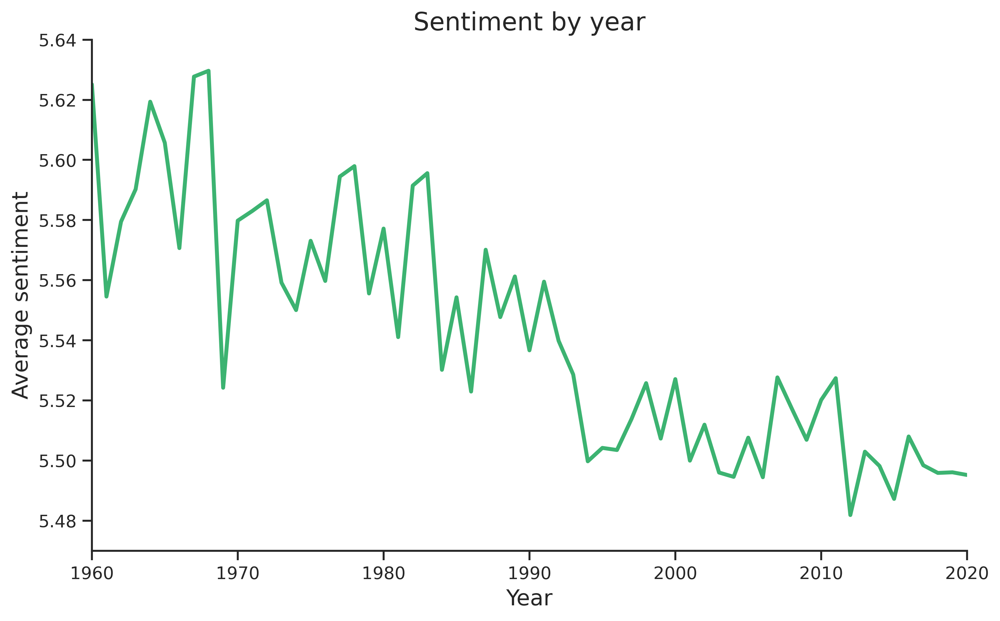

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

ax.plot(years,sentiment_time, color = "mediumseagreen")
ax.set_xlabel("Year", size=14)
ax.set_ylabel("Average sentiment", size=14)
ax.set_title("Sentiment by year", size=16)

ax.set_xlim((1960, 2020))
ax.set_ylim((5.47, 5.64))

sns.despine()
plt.show()

In [ ]:
print("Highest sentiment:", round(max(sentiment_time),2))
print("Lowest sentiment:", round(min(sentiment_time),2))
print("Difference:", round(max(sentiment_time)-min(sentiment_time),2))

Highest sentiment: 5.63
Lowest sentiment: 5.48
Difference: 0.15


The plot shows that generally from 1960 to 2020 the sentiment of the songs has been decreasing, meaning that overall the song lyrics have become sadder.
However, during this period, the biggest difference in sentiment has only been 0.15.  

One reason for the decrease in sentiment could be due to the increase of *Hip-Hop* songs after 1990 (as shown in the area plot), 
as it was found that this genre also had the lowest average sentiment.
The same explanation can be given for the higher sentiment from 1960 to 1970 as this is where the genre with the highest average sentiment, *Funk-Soul*, is dominant.

Another interesting observation is that during 1969 the average sentiment drops dramatically for one year.
This is the same year the Richard Nixon became the president of the United States of America
 and also a time where the protests against the Vietnam War started rising and bands started joining the anti-war movement.
And as most of the songs are American it could therefore be these events can be seen in the development of the sentiment.

# Conclusion

To answer the question of how artists collaborate, a network of 3098 musicians from 8 different genres was constructed.
The analysis of the network showed that overall the artists which are popular tend to do more collaborations.
However, the level of collaboration also turned out to be dependant of the genre.
*Hip-Hop* being the genre with generally the highest amount of collaborations while the lowest amount of collaboration was found among the genres *Alternative*, *Rock* and *Punk*.
*Hip-Hop* was also found to be the genre with the highest amount of collaborations within itself.
Meaning that *Hip-Hop* artists collaborate more together than with other artists, which was similar for *Reggae* and *Country*.
And, not so surprisingly, it was also found that genres with similar characteristics tend to collaborate more, 
such as *Funk-Soul* and *Hip-Hop* as well as *Rock*, *Alternative* and *Country*.

By further downloading song lyrics for all artists of the network and analysing the text, more characteristics were revealed. 
Overall the saddest lyrics, accordingly to the sentiment analysis, were found to come from *Hip-Hop* artists 
while the happiest lyrics were associated with *Funk-Soul*.
This was further backed up by visualizing word clouds for each genre as these showed rather harsh words for exactly the *Hip-Hop* genre.
To analyse further, the year of the songs and artist were also introduced.
This showed that from 1960 to 2020 the sentiment had overall fallen, meaning that generally, the lyrics of songs had become sadder with time.
By looking at the level of collaboration and year of an artist it was found that the average amount of collaborations for an artist went from 2.5 to 20, 
being now eight times higher.
Meaning newer artists generally collaborate more.

All of these results are however based on just a small subset of artists and a few of their songs.
By choosing different artists and including more song lyrics the results and conclusion could change accordingly.
Furthermore, many of the conclusions are based on the genres of the artists which were constructed from the partitions of the genres network.
The chosen genres for every artist thus might not be always correct and the fact that artists can be in several genres is not taken into account,
 which again might influence the results.

<!-- # I am adding one final comment, to talk about the methods used, but i think the rest can be directly posted in the web-as is. -->
<!-- Finally, doing all these analysis allow us to see how the different tools used can be applied toward different ends. 
 Creating a seperate network for genres and applying *partitions* resulted in 

that gathering information from different sources can be a difficult exercise, how tools such as the partitions  -->